# Model Training Implementation

In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import random
from tqdm import tqdm
import unittest

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms, models

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split

torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

e:\Antify-ai-component\env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Data Exploration

Explore the dataset structure and understand the distribution of ant species images.

Found 15 ant species: ['Anochetus_graeffei', 'Anoplolepis_gracilipes', 'Carebara_diversa', 'Dinomyrmex_gigas', 'Dolichoderus_thoracicus', 'Iridomyrmex_anceps', 'Leptogenys_birmana', 'Monomorium_floricola', 'Odontoponera_denticulata', 'Polyrhachis_armata', 'Pseudoneoponera_rufipes', 'Recurvidris_recurvispinosa', 'Solenopsis_geminata', 'Tapinoma_melanocephalum', 'Tetraponera_rufonigra']
Total images: 1498

Class distribution:
species
Anochetus_graeffei            100
Anoplolepis_gracilipes        100
Carebara_diversa              100
Dinomyrmex_gigas              100
Dolichoderus_thoracicus       100
Iridomyrmex_anceps            100
Leptogenys_birmana            100
Monomorium_floricola          100
Odontoponera_denticulata      100
Polyrhachis_armata            100
Solenopsis_geminata           100
Tapinoma_melanocephalum       100
Tetraponera_rufonigra         100
Pseudoneoponera_rufipes        99
Recurvidris_recurvispinosa     99
Name: count, dtype: int64


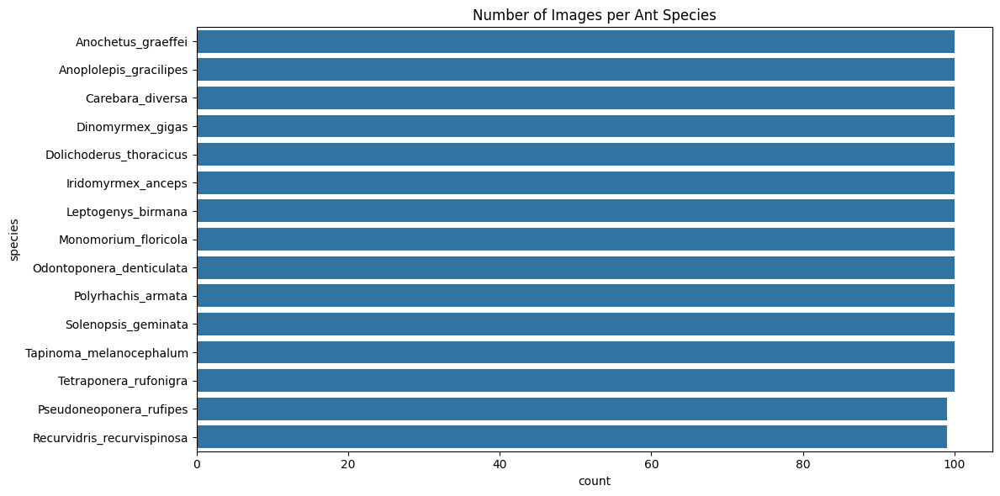

In [4]:
data_dir = 'data/'

# Get all species folders
species_folders = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))]
print(f"Found {len(species_folders)} ant species: {species_folders}")

# Count images per species and collect image paths
species_counts = {}
image_paths = []
labels = []

for species in species_folders:
    species_dir = os.path.join(data_dir, species)
    image_files = [f for f in os.listdir(species_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    species_counts[species] = len(image_files)
    
    for img_file in image_files:
        image_paths.append(os.path.join(species_dir, img_file))
        labels.append(species)

# Create a DataFrame for easier analysis
df = pd.DataFrame({
    'image_path': image_paths,
    'species': labels
})

print(f"Total images: {len(df)}")
print("\nClass distribution:")
print(df['species'].value_counts())

# Plot class distribution
plt.figure(figsize=(12, 6))
sns.countplot(y='species', data=df, order=df['species'].value_counts().index)
plt.title('Number of Images per Ant Species')
plt.tight_layout()
plt.show()

### Image Properties Exploration

Analyzing images: 100%|██████████| 100/100 [00:00<00:00, 112.18it/s]



Image properties summary:
            width      height
count  100.000000  100.000000
mean   324.310000  267.240000
std    126.835668  109.005895
min    135.000000  111.000000
25%    240.000000  175.750000
50%    240.000000  240.000000
75%    500.000000  333.000000
max    500.000000  500.000000

Image color modes:
mode
RGB    100
Name: count, dtype: int64


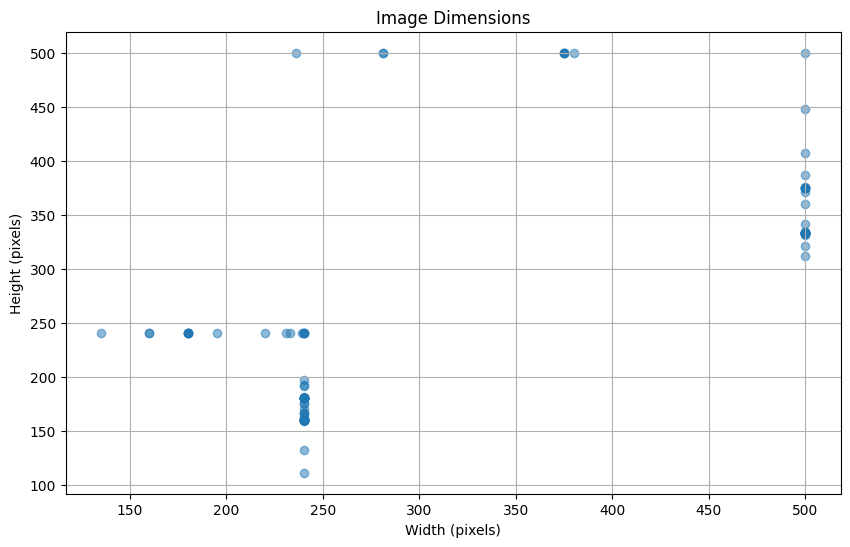

In [5]:
# Analyze image properties
def get_image_properties(image_path):
    try:
        img = Image.open(image_path)
        return {
            'width': img.width,
            'height': img.height,
            'mode': img.mode,
            'format': img.format
        }
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None

# Sample a subset of images for analysis
sample_size = min(100, len(df))
sampled_images = df.sample(sample_size)['image_path'].tolist()

image_properties = []
for img_path in tqdm(sampled_images, desc="Analyzing images"):
    props = get_image_properties(img_path)
    if props:
        image_properties.append(props)

props_df = pd.DataFrame(image_properties)
print("\nImage properties summary:")
print(props_df.describe())

# Count image modes
print("\nImage color modes:")
print(props_df['mode'].value_counts())

# Plot image dimensions
plt.figure(figsize=(10, 6))
plt.scatter(props_df['width'], props_df['height'], alpha=0.5)
plt.title('Image Dimensions')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.grid(True)
plt.show()

### Display Sample Images

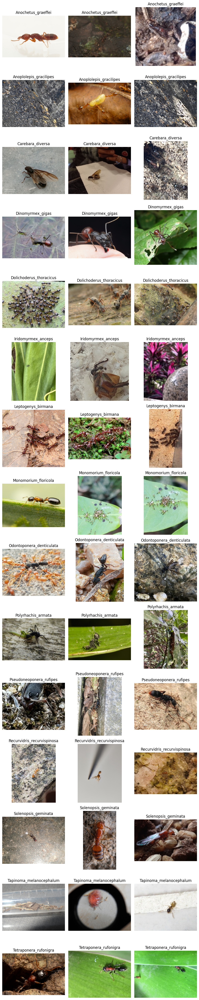

In [6]:
# Display sample images from each species
def show_sample_images(df, n_per_class=3):
    species_list = df['species'].unique()
    n_species = len(species_list)
    
    fig, axes = plt.subplots(n_species, n_per_class, figsize=(n_per_class*3, n_species*3))
    
    for i, species in enumerate(species_list):
        species_images = df[df['species'] == species]['image_path'].tolist()
        samples = random.sample(species_images, min(n_per_class, len(species_images)))
        
        for j, img_path in enumerate(samples):
            img = Image.open(img_path)
            if n_species > 1:
                ax = axes[i, j]
            else:
                ax = axes[j]
            ax.imshow(img)
            ax.set_title(f"{species}")
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

show_sample_images(df)

## Data Preprocessing and Dataset Creation

In [7]:
# Create label mapping
species_to_idx = {species: idx for idx, species in enumerate(sorted(df['species'].unique()))}
idx_to_species = {idx: species for species, idx in species_to_idx.items()}

print("Label mapping:")
for species, idx in species_to_idx.items():
    print(f"{species}: {idx}")

# Split data into train, validation, and test sets
train_val_df, test_df = train_test_split(df, test_size=0.15, stratify=df['species'], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.15, stratify=train_val_df['species'], random_state=42)

print(f"\nTrain set: {len(train_df)} images")
print(f"Validation set: {len(val_df)} images")
print(f"Test set: {len(test_df)} images")

Label mapping:
Anochetus_graeffei: 0
Anoplolepis_gracilipes: 1
Carebara_diversa: 2
Dinomyrmex_gigas: 3
Dolichoderus_thoracicus: 4
Iridomyrmex_anceps: 5
Leptogenys_birmana: 6
Monomorium_floricola: 7
Odontoponera_denticulata: 8
Polyrhachis_armata: 9
Pseudoneoponera_rufipes: 10
Recurvidris_recurvispinosa: 11
Solenopsis_geminata: 12
Tapinoma_melanocephalum: 13
Tetraponera_rufonigra: 14

Train set: 1082 images
Validation set: 191 images
Test set: 225 images


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.5528543].


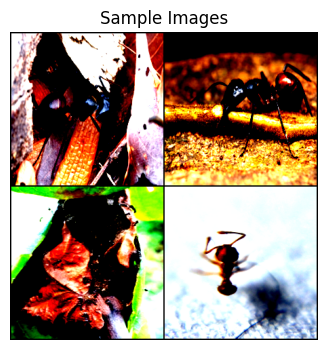

Sample labels:
Image 1: Dinomyrmex_gigas
Image 2: Dinomyrmex_gigas
Image 3: Dolichoderus_thoracicus
Image 4: Recurvidris_recurvispinosa


In [8]:
# Create custom dataset class with extreme optimizations
class AntSpeciesDataset(Dataset):
    def __init__(self, dataframe, transform=None, preload=False):
        self.img_paths = dataframe['image_path'].tolist()
        self.labels = [species_to_idx[species] for species in dataframe['species']]
        self.transform = transform

        # Preload all images into memory
        self.preloaded_images = None
        if preload:
            self.preloaded_images = []
            for path in self.img_paths:
                img = Image.open(path).convert('RGB')
                img = img.resize((224, 224), Image.BILINEAR)  # Resize
                self.preloaded_images.append(img)

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        # Use preloaded image if available
        if self.preloaded_images is not None:
            image = self.preloaded_images[idx]
        else:
            # Load and resize
            image = Image.open(self.img_paths[idx]).convert('RGB')
            image = image.resize((224, 224), Image.BILINEAR)

        # Apply remaining transforms
        if self.transform:
            image = self.transform(image)

        return image, self.labels[idx]

# Minimal transformations
train_transform = transforms.Compose([
    # Resize already done in dataset
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    # Resize already done in dataset
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets
train_dataset = AntSpeciesDataset(train_df, transform=train_transform, preload=False)
val_dataset = AntSpeciesDataset(val_df, transform=val_test_transform, preload=True)
test_dataset = AntSpeciesDataset(test_df, transform=val_test_transform, preload=True)

# Create data loaders
batch_size = 16  # Reduced batch size
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0,  # No multiprocessing overhead
    pin_memory=True
)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)
test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)

# Simplified batch display
def show_batch(dataloader):
    for images, labels in dataloader:
        grid = torchvision.utils.make_grid(images[:4], nrow=2)
        plt.figure(figsize=(8, 4))
        plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
        plt.title('Sample Images')
        plt.axis('off')
        plt.show()

        print("Sample labels:")
        for i in range(min(4, len(labels))):
            print(f"Image {i+1}: {idx_to_species[labels[i].item()]}")
        break

show_batch(train_loader)

## Model Architectures

Implement multiple CNN architectures for comparison.

In [9]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define a simple custom CNN model
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(256 * 14 * 14, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )
        
    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# Function to create a pre-trained model with modified classifier
def create_pretrained_model(model_name, num_classes, freeze_backbone=True):
    if model_name == 'resnet18':
        model = models.resnet18(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.fc = nn.Linear(model.fc.in_features, num_classes)

    elif model_name == 'resnet50':
        model = models.resnet50(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.fc = nn.Linear(model.fc.in_features, num_classes)

    elif model_name == 'mobilenet_v2':
        model = models.mobilenet_v2(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

    elif model_name == 'efficientnet_b0':
        model = models.efficientnet_b0(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

    elif model_name == 'efficientnet_b1':
        model = models.efficientnet_b1(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

    elif model_name == 'vgg16':
        model = models.vgg16(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)

    elif model_name == 'densenet121':
        model = models.densenet121(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)

    elif model_name == 'mobilenet_v3_large':
        model = models.mobilenet_v3_large(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[3] = nn.Linear(model.classifier[3].in_features, num_classes)

    elif model_name == 'mobilenet_v3_small':
        model = models.mobilenet_v3_small(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[3] = nn.Linear(model.classifier[3].in_features, num_classes)

    elif model_name == 'squeezenet1_0':
        model = models.squeezenet1_0(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=1)

    elif model_name == 'mnasnet1_0':
        model = models.mnasnet1_0(pretrained=True)
        if freeze_backbone:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

    return model

# List of models to train
models_to_train = {
    'simple_cnn': SimpleCNN(num_classes=len(species_to_idx)),
    'resnet18': create_pretrained_model('resnet18', num_classes=len(species_to_idx)),
    'mobilenet_v2': create_pretrained_model('mobilenet_v2', num_classes=len(species_to_idx)),
    'efficientnet_b0': create_pretrained_model('efficientnet_b0', num_classes=len(species_to_idx)),
    'mobilenet_v3_small': create_pretrained_model('mobilenet_v3_small', num_classes=len(species_to_idx)),
    'squeezenet1_0': create_pretrained_model('squeezenet1_0', num_classes=len(species_to_idx)),
    'mnasnet1_0': create_pretrained_model('mnasnet1_0', num_classes=len(species_to_idx))
}

Using device: cpu


e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get t

## Training and Validation

In [10]:
# Training function
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=10, model_name="model"):
    model = model.to(device)
    best_val_acc = 0.0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        running_corrects = 0
        
        for inputs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
        
        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)
        
        history['train_loss'].append(epoch_loss)
        history['train_acc'].append(epoch_acc.item())
        
        # Validation phase
        val_loss, val_acc = evaluate_model(model, val_loader, criterion)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        
        # Update learning rate
        if scheduler is not None:
            scheduler.step(val_loss)
        
        # Save best model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), f"{model_name}_best.pth")
        
        print(f"Epoch {epoch+1}/{num_epochs} - "
              f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    # Load best model weights
    model.load_state_dict(torch.load(f"{model_name}_best.pth"))
    return model, history

# Evaluation function
def evaluate_model(model, dataloader, criterion):
    model.eval()
    running_loss = 0.0
    running_corrects = 0
    
    with torch.no_grad():
        for inputs, labels in tqdm(dataloader, desc="Evaluating"):
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
    
    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_acc = running_corrects.double() / len(dataloader.dataset)
    
    return epoch_loss, epoch_acc.item()

# Test function with detailed metrics
def test_model(model, test_loader):
    model.eval()
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc="Testing"):
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # Convert to numpy arrays
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    
    # Calculate accuracy
    accuracy = accuracy_score(all_labels, all_preds)
    
    # Generate classification report
    class_names = [idx_to_species[i] for i in range(len(idx_to_species))]
    report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)
    
    # Generate confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    
    return accuracy, report, cm, all_preds, all_labels

# Plot training history
def plot_training_history(history, model_name):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train')
    plt.plot(history['val_loss'], label='Validation')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train')
    plt.plot(history['val_acc'], label='Validation')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Plot confusion matrix
def plot_confusion_matrix(cm, class_names, model_name):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'{model_name} - Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

## Model Training and Evaluation

Train each model and compare their performance.


Training simple_cnn


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  5.60it/s]


Epoch 1/10 - Train Loss: 2.7087, Train Acc: 0.0850, Val Loss: 2.5850, Val Acc: 0.1518


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.15it/s]


Epoch 2/10 - Train Loss: 2.5646, Train Acc: 0.1534, Val Loss: 2.5042, Val Acc: 0.1675


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.29it/s]


Epoch 3/10 - Train Loss: 2.4456, Train Acc: 0.1738, Val Loss: 2.2767, Val Acc: 0.2408


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.05it/s]


Epoch 4/10 - Train Loss: 2.3528, Train Acc: 0.2366, Val Loss: 2.2662, Val Acc: 0.2461


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.28it/s]


Epoch 5/10 - Train Loss: 2.2194, Train Acc: 0.2643, Val Loss: 2.1254, Val Acc: 0.3194


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.25it/s]


Epoch 6/10 - Train Loss: 1.9869, Train Acc: 0.3651, Val Loss: 2.2032, Val Acc: 0.2723


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.29it/s]


Epoch 7/10 - Train Loss: 1.9156, Train Acc: 0.3854, Val Loss: 2.0488, Val Acc: 0.3141


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.26it/s]


Epoch 8/10 - Train Loss: 1.6749, Train Acc: 0.4658, Val Loss: 1.9034, Val Acc: 0.4293


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.32it/s]


Epoch 9/10 - Train Loss: 1.3958, Train Acc: 0.5684, Val Loss: 1.6332, Val Acc: 0.4974


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.43it/s]


Epoch 10/10 - Train Loss: 1.1008, Train Acc: 0.6442, Val Loss: 1.8450, Val Acc: 0.4764


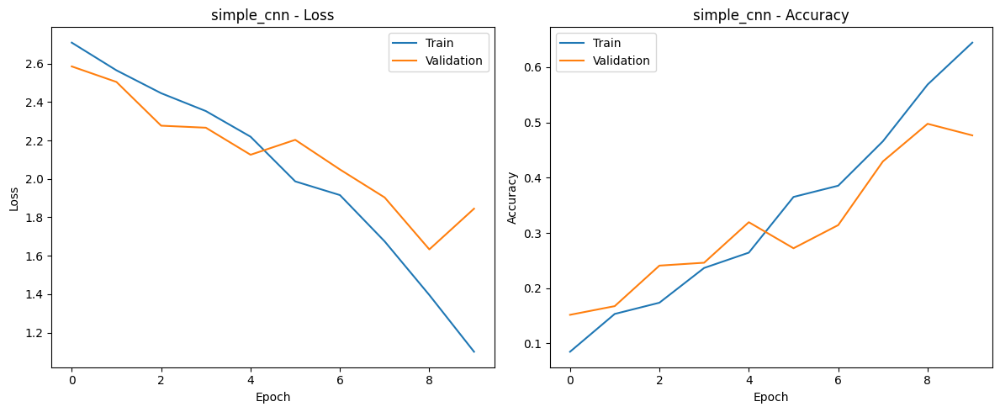

Testing: 100%|██████████| 15/15 [00:04<00:00,  3.48it/s]


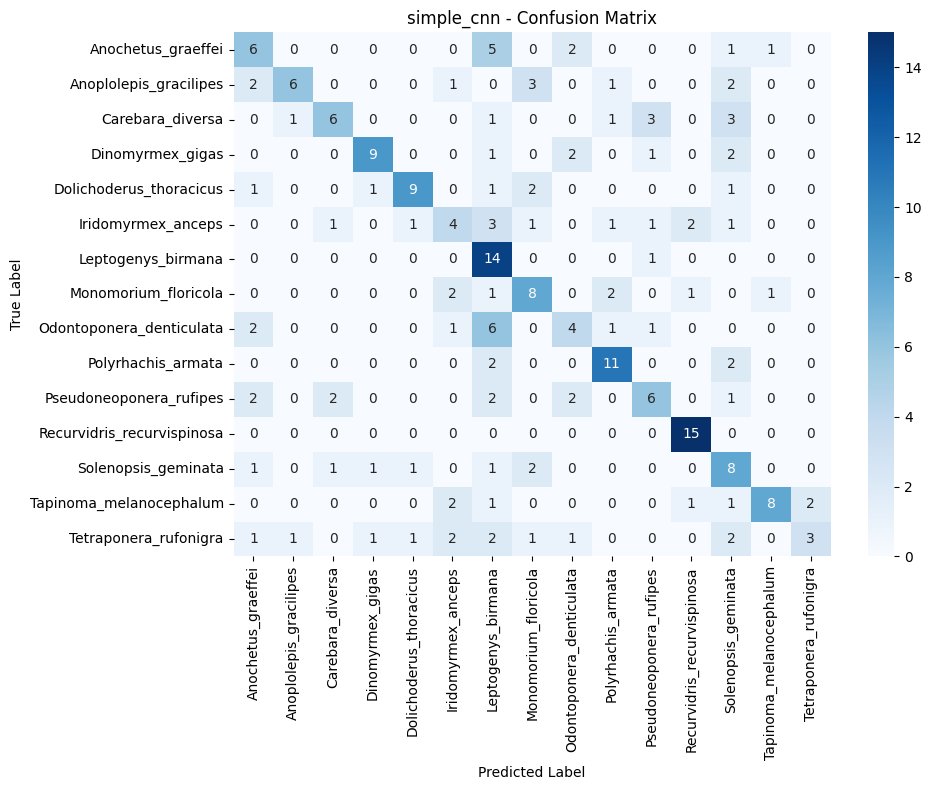


simple_cnn Test Accuracy: 0.5200

Classification Report:
                            precision    recall  f1-score  support
Anochetus_graeffei           0.400000  0.400000  0.400000    15.00
Anoplolepis_gracilipes       0.750000  0.400000  0.521739    15.00
Carebara_diversa             0.600000  0.400000  0.480000    15.00
Dinomyrmex_gigas             0.750000  0.600000  0.666667    15.00
Dolichoderus_thoracicus      0.750000  0.600000  0.666667    15.00
Iridomyrmex_anceps           0.333333  0.266667  0.296296    15.00
Leptogenys_birmana           0.350000  0.933333  0.509091    15.00
Monomorium_floricola         0.470588  0.533333  0.500000    15.00
Odontoponera_denticulata     0.363636  0.266667  0.307692    15.00
Polyrhachis_armata           0.647059  0.733333  0.687500    15.00
Pseudoneoponera_rufipes      0.461538  0.400000  0.428571    15.00
Recurvidris_recurvispinosa   0.789474  1.000000  0.882353    15.00
Solenopsis_geminata          0.333333  0.533333  0.410256    15.00
Tapi

Evaluating: 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]


Epoch 1/10 - Train Loss: 2.4852, Train Acc: 0.2089, Val Loss: 2.1347, Val Acc: 0.3613


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.81it/s]


Epoch 2/10 - Train Loss: 1.8481, Train Acc: 0.4538, Val Loss: 1.7666, Val Acc: 0.4921


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.97it/s]


Epoch 3/10 - Train Loss: 1.5006, Train Acc: 0.6063, Val Loss: 1.5736, Val Acc: 0.4974


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.62it/s]


Epoch 4/10 - Train Loss: 1.3309, Train Acc: 0.6470, Val Loss: 1.4197, Val Acc: 0.5602


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.84it/s]


Epoch 5/10 - Train Loss: 1.1829, Train Acc: 0.6895, Val Loss: 1.3684, Val Acc: 0.5497


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.05it/s]


Epoch 6/10 - Train Loss: 1.0263, Train Acc: 0.7477, Val Loss: 1.3211, Val Acc: 0.5602


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.78it/s]


Epoch 7/10 - Train Loss: 0.9440, Train Acc: 0.7606, Val Loss: 1.2519, Val Acc: 0.6230


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.81it/s]


Epoch 8/10 - Train Loss: 0.8765, Train Acc: 0.7791, Val Loss: 1.2230, Val Acc: 0.6178


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.82it/s]


Epoch 9/10 - Train Loss: 0.8463, Train Acc: 0.7819, Val Loss: 1.1825, Val Acc: 0.6440


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.72it/s]


Epoch 10/10 - Train Loss: 0.7864, Train Acc: 0.7957, Val Loss: 1.1936, Val Acc: 0.6073


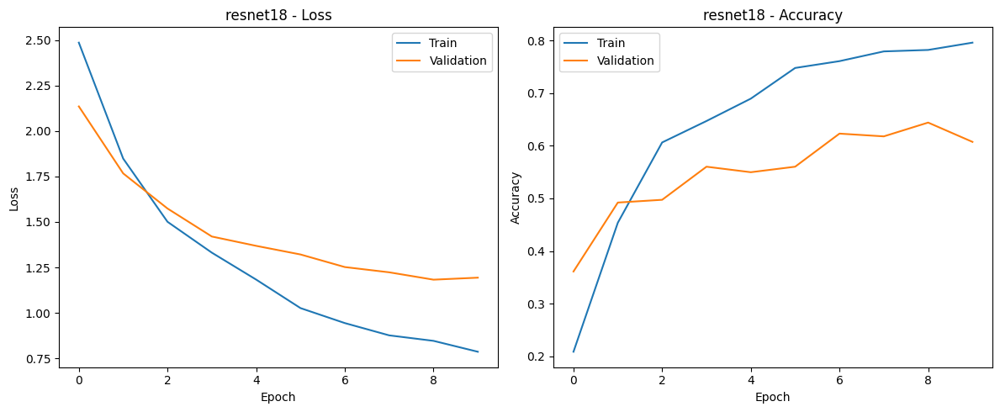

Testing: 100%|██████████| 15/15 [00:03<00:00,  4.08it/s]


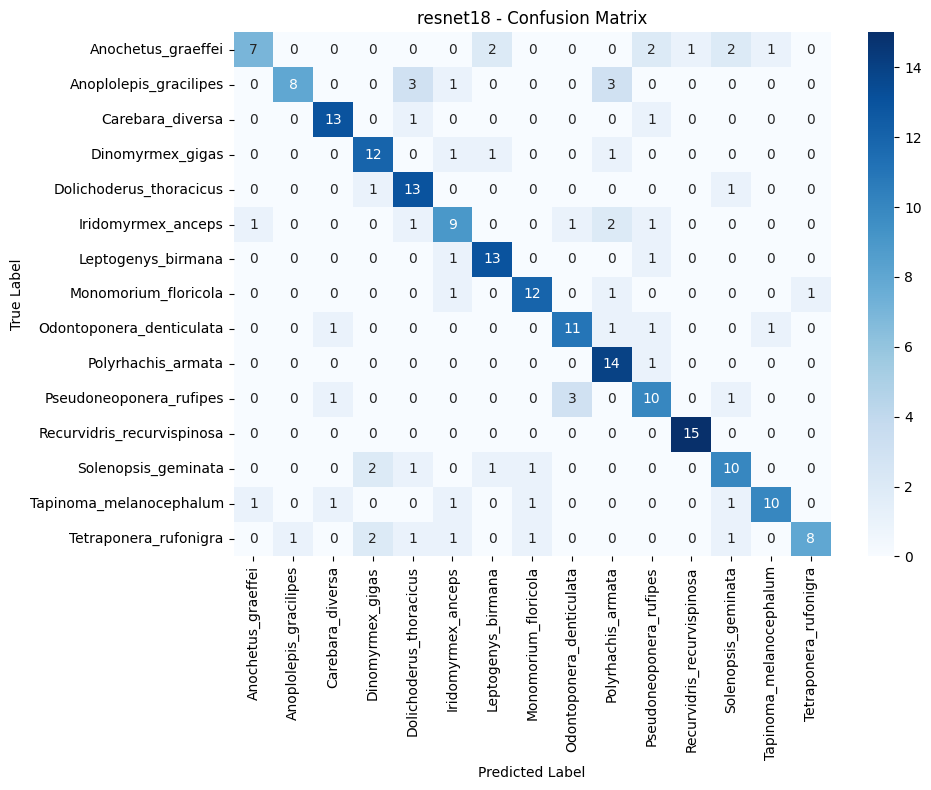


resnet18 Test Accuracy: 0.7333

Classification Report:
                            precision    recall  f1-score     support
Anochetus_graeffei           0.777778  0.466667  0.583333   15.000000
Anoplolepis_gracilipes       0.888889  0.533333  0.666667   15.000000
Carebara_diversa             0.812500  0.866667  0.838710   15.000000
Dinomyrmex_gigas             0.705882  0.800000  0.750000   15.000000
Dolichoderus_thoracicus      0.650000  0.866667  0.742857   15.000000
Iridomyrmex_anceps           0.600000  0.600000  0.600000   15.000000
Leptogenys_birmana           0.764706  0.866667  0.812500   15.000000
Monomorium_floricola         0.800000  0.800000  0.800000   15.000000
Odontoponera_denticulata     0.733333  0.733333  0.733333   15.000000
Polyrhachis_armata           0.636364  0.933333  0.756757   15.000000
Pseudoneoponera_rufipes      0.588235  0.666667  0.625000   15.000000
Recurvidris_recurvispinosa   0.937500  1.000000  0.967742   15.000000
Solenopsis_geminata          0.625

Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.87it/s]


Epoch 1/10 - Train Loss: 2.3824, Train Acc: 0.2551, Val Loss: 1.8440, Val Acc: 0.5236


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.80it/s]


Epoch 2/10 - Train Loss: 1.5760, Train Acc: 0.5518, Val Loss: 1.4332, Val Acc: 0.5916


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.96it/s]


Epoch 3/10 - Train Loss: 1.2742, Train Acc: 0.6543, Val Loss: 1.2903, Val Acc: 0.6178


Evaluating: 100%|██████████| 12/12 [00:04<00:00,  2.67it/s]


Epoch 4/10 - Train Loss: 1.0617, Train Acc: 0.7246, Val Loss: 1.1583, Val Acc: 0.6754


Evaluating: 100%|██████████| 12/12 [00:04<00:00,  2.78it/s]


Epoch 5/10 - Train Loss: 0.9551, Train Acc: 0.7348, Val Loss: 1.1352, Val Acc: 0.6545


Evaluating: 100%|██████████| 12/12 [00:04<00:00,  2.71it/s]


Epoch 6/10 - Train Loss: 0.8716, Train Acc: 0.7616, Val Loss: 1.0700, Val Acc: 0.6597


Evaluating: 100%|██████████| 12/12 [00:04<00:00,  2.83it/s]


Epoch 7/10 - Train Loss: 0.7531, Train Acc: 0.7994, Val Loss: 1.0465, Val Acc: 0.6859


Evaluating: 100%|██████████| 12/12 [00:04<00:00,  2.64it/s]


Epoch 8/10 - Train Loss: 0.7466, Train Acc: 0.7911, Val Loss: 0.9774, Val Acc: 0.6963


Evaluating: 100%|██████████| 12/12 [00:04<00:00,  2.67it/s]


Epoch 9/10 - Train Loss: 0.6727, Train Acc: 0.8189, Val Loss: 0.9401, Val Acc: 0.7016


Evaluating: 100%|██████████| 12/12 [00:04<00:00,  2.58it/s]


Epoch 10/10 - Train Loss: 0.6332, Train Acc: 0.8373, Val Loss: 0.9128, Val Acc: 0.7068


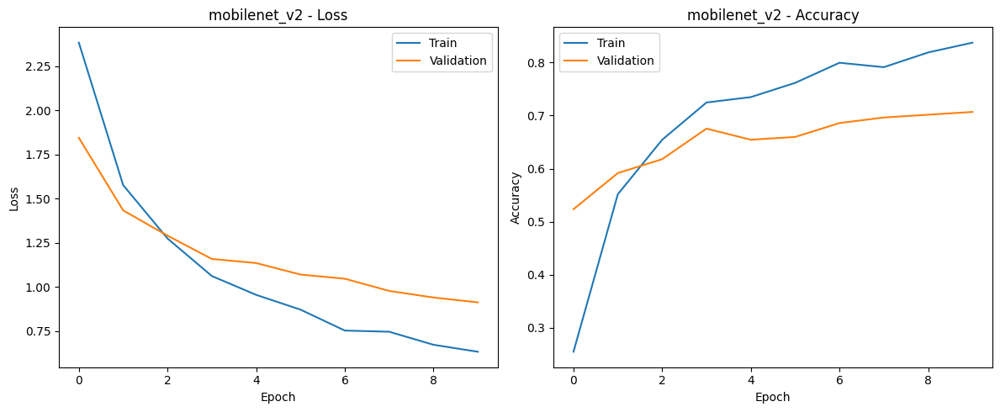

Testing: 100%|██████████| 15/15 [00:05<00:00,  2.63it/s]


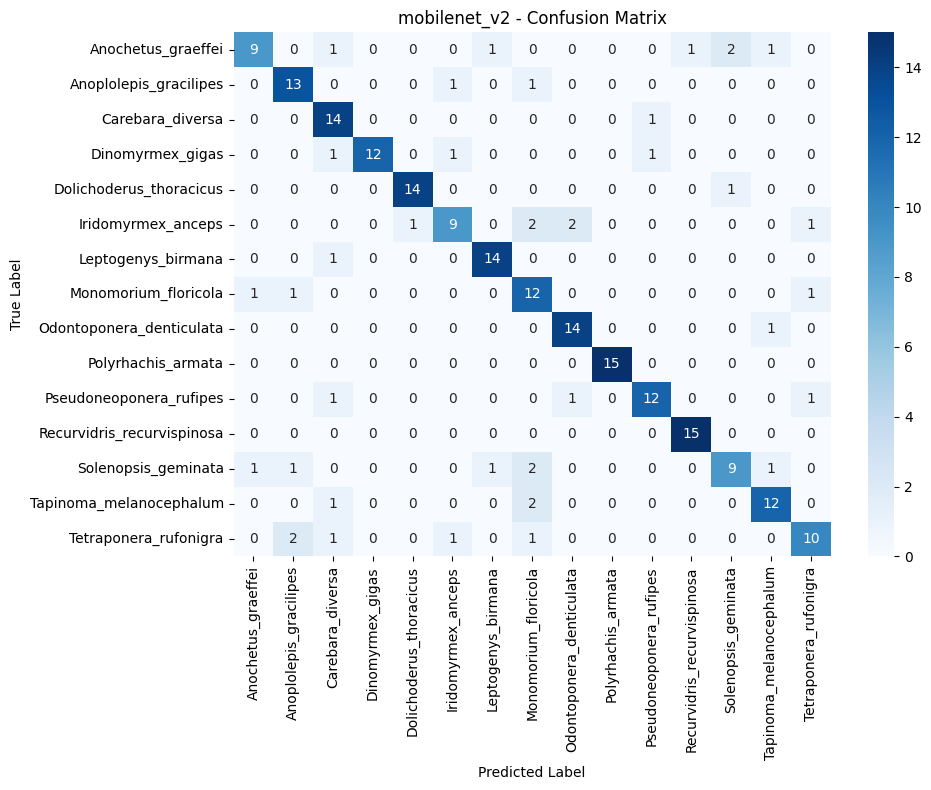


mobilenet_v2 Test Accuracy: 0.8178

Classification Report:
                            precision    recall  f1-score     support
Anochetus_graeffei           0.818182  0.600000  0.692308   15.000000
Anoplolepis_gracilipes       0.764706  0.866667  0.812500   15.000000
Carebara_diversa             0.700000  0.933333  0.800000   15.000000
Dinomyrmex_gigas             1.000000  0.800000  0.888889   15.000000
Dolichoderus_thoracicus      0.933333  0.933333  0.933333   15.000000
Iridomyrmex_anceps           0.750000  0.600000  0.666667   15.000000
Leptogenys_birmana           0.875000  0.933333  0.903226   15.000000
Monomorium_floricola         0.600000  0.800000  0.685714   15.000000
Odontoponera_denticulata     0.823529  0.933333  0.875000   15.000000
Polyrhachis_armata           1.000000  1.000000  1.000000   15.000000
Pseudoneoponera_rufipes      0.857143  0.800000  0.827586   15.000000
Recurvidris_recurvispinosa   0.937500  1.000000  0.967742   15.000000
Solenopsis_geminata          0

Evaluating: 100%|██████████| 12/12 [00:05<00:00,  2.26it/s]


Epoch 1/10 - Train Loss: 2.4123, Train Acc: 0.2810, Val Loss: 2.0399, Val Acc: 0.4660


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.03it/s]


Epoch 2/10 - Train Loss: 1.7805, Train Acc: 0.5758, Val Loss: 1.7006, Val Acc: 0.5759


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.21it/s]


Epoch 3/10 - Train Loss: 1.4568, Train Acc: 0.6506, Val Loss: 1.4993, Val Acc: 0.6073


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.24it/s]


Epoch 4/10 - Train Loss: 1.2971, Train Acc: 0.6858, Val Loss: 1.3573, Val Acc: 0.6440


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.29it/s]


Epoch 5/10 - Train Loss: 1.1226, Train Acc: 0.7338, Val Loss: 1.2990, Val Acc: 0.6597


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.38it/s]


Epoch 6/10 - Train Loss: 1.0059, Train Acc: 0.7819, Val Loss: 1.1893, Val Acc: 0.6911


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.37it/s]


Epoch 7/10 - Train Loss: 0.9420, Train Acc: 0.7689, Val Loss: 1.1653, Val Acc: 0.6649


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.23it/s]


Epoch 8/10 - Train Loss: 0.8738, Train Acc: 0.7930, Val Loss: 1.1087, Val Acc: 0.6911


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.34it/s]


Epoch 9/10 - Train Loss: 0.8141, Train Acc: 0.7976, Val Loss: 1.0549, Val Acc: 0.6859


Evaluating: 100%|██████████| 12/12 [00:03<00:00,  3.50it/s]


Epoch 10/10 - Train Loss: 0.7497, Train Acc: 0.8281, Val Loss: 1.0506, Val Acc: 0.7173


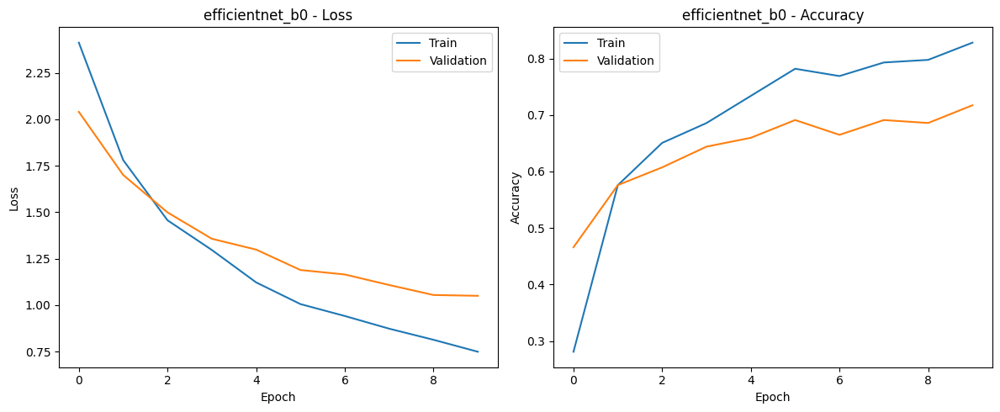

Testing: 100%|██████████| 15/15 [00:04<00:00,  3.48it/s]


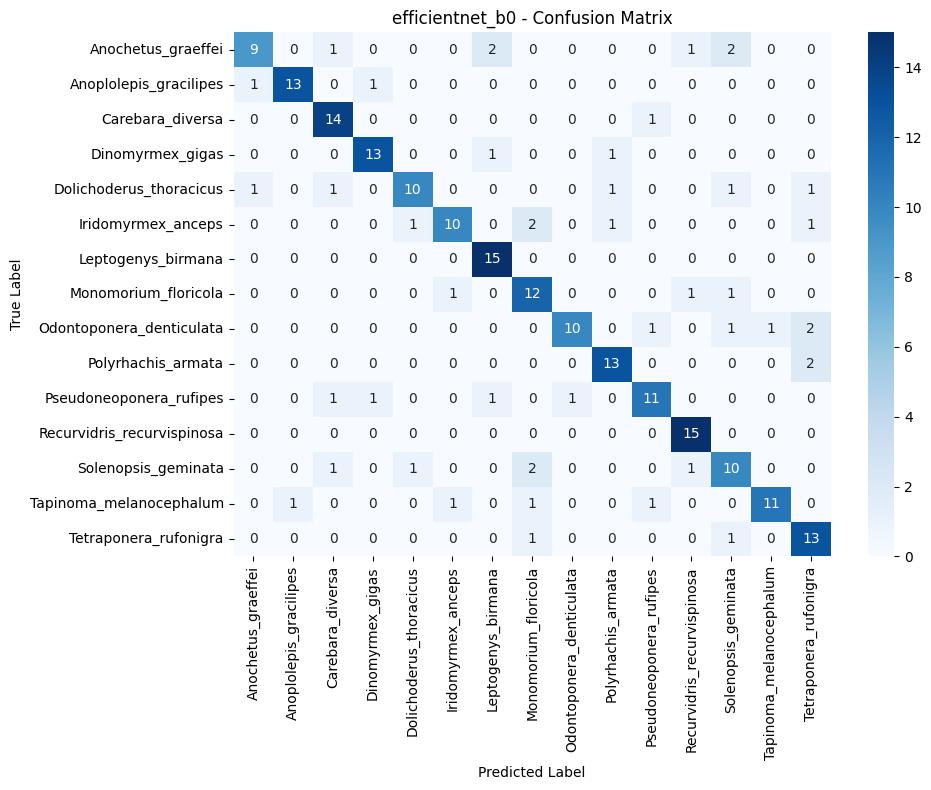


efficientnet_b0 Test Accuracy: 0.7956

Classification Report:
                            precision    recall  f1-score     support
Anochetus_graeffei           0.818182  0.600000  0.692308   15.000000
Anoplolepis_gracilipes       0.928571  0.866667  0.896552   15.000000
Carebara_diversa             0.777778  0.933333  0.848485   15.000000
Dinomyrmex_gigas             0.866667  0.866667  0.866667   15.000000
Dolichoderus_thoracicus      0.833333  0.666667  0.740741   15.000000
Iridomyrmex_anceps           0.833333  0.666667  0.740741   15.000000
Leptogenys_birmana           0.789474  1.000000  0.882353   15.000000
Monomorium_floricola         0.666667  0.800000  0.727273   15.000000
Odontoponera_denticulata     0.909091  0.666667  0.769231   15.000000
Polyrhachis_armata           0.812500  0.866667  0.838710   15.000000
Pseudoneoponera_rufipes      0.785714  0.733333  0.758621   15.000000
Recurvidris_recurvispinosa   0.833333  1.000000  0.909091   15.000000
Solenopsis_geminata        

Evaluating: 100%|██████████| 12/12 [00:01<00:00,  9.45it/s]


Epoch 1/10 - Train Loss: 2.3339, Train Acc: 0.2837, Val Loss: 1.9158, Val Acc: 0.4817


Evaluating: 100%|██████████| 12/12 [00:01<00:00,  8.75it/s]


Epoch 2/10 - Train Loss: 1.6356, Train Acc: 0.5832, Val Loss: 1.5300, Val Acc: 0.6126


Evaluating: 100%|██████████| 12/12 [00:01<00:00, 10.47it/s]


Epoch 3/10 - Train Loss: 1.2912, Train Acc: 0.7070, Val Loss: 1.3316, Val Acc: 0.6492


Evaluating: 100%|██████████| 12/12 [00:01<00:00,  8.55it/s]


Epoch 4/10 - Train Loss: 1.0987, Train Acc: 0.7421, Val Loss: 1.2085, Val Acc: 0.6545


Evaluating: 100%|██████████| 12/12 [00:01<00:00,  9.25it/s]


Epoch 5/10 - Train Loss: 0.9633, Train Acc: 0.7902, Val Loss: 1.1241, Val Acc: 0.7068


Evaluating: 100%|██████████| 12/12 [00:01<00:00,  9.82it/s]


Epoch 6/10 - Train Loss: 0.8601, Train Acc: 0.7948, Val Loss: 1.0721, Val Acc: 0.6859


Evaluating: 100%|██████████| 12/12 [00:01<00:00,  8.59it/s]


Epoch 7/10 - Train Loss: 0.7466, Train Acc: 0.8346, Val Loss: 1.0343, Val Acc: 0.7016


Evaluating: 100%|██████████| 12/12 [00:01<00:00,  9.98it/s]


Epoch 8/10 - Train Loss: 0.6745, Train Acc: 0.8651, Val Loss: 1.0026, Val Acc: 0.7068


Evaluating: 100%|██████████| 12/12 [00:01<00:00,  9.03it/s]


Epoch 9/10 - Train Loss: 0.6267, Train Acc: 0.8632, Val Loss: 0.9709, Val Acc: 0.7120


Evaluating: 100%|██████████| 12/12 [00:01<00:00,  8.96it/s]


Epoch 10/10 - Train Loss: 0.5850, Train Acc: 0.8660, Val Loss: 0.9596, Val Acc: 0.7173


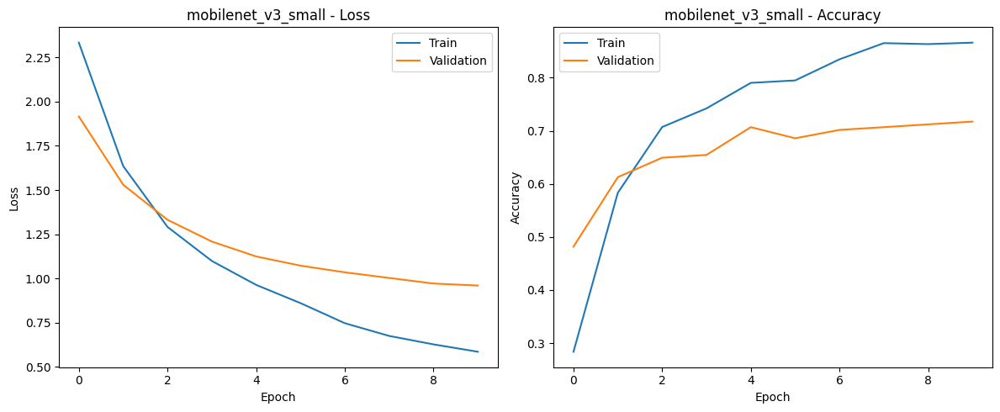

Testing: 100%|██████████| 15/15 [00:01<00:00,  9.32it/s]


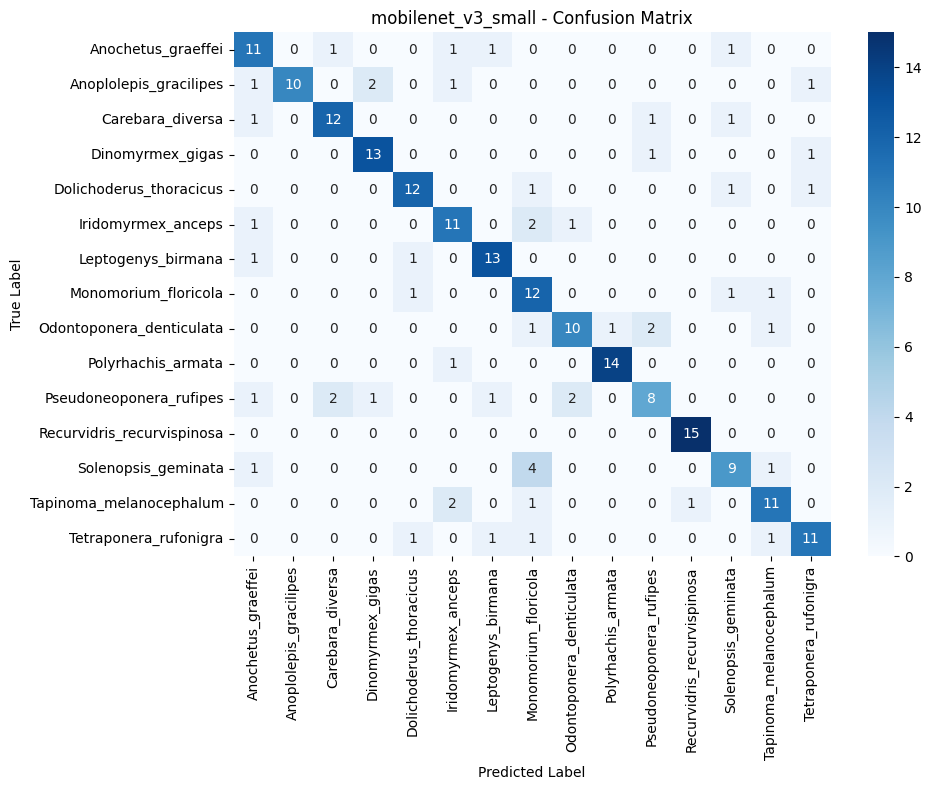


mobilenet_v3_small Test Accuracy: 0.7644

Classification Report:
                            precision    recall  f1-score     support
Anochetus_graeffei           0.647059  0.733333  0.687500   15.000000
Anoplolepis_gracilipes       1.000000  0.666667  0.800000   15.000000
Carebara_diversa             0.800000  0.800000  0.800000   15.000000
Dinomyrmex_gigas             0.812500  0.866667  0.838710   15.000000
Dolichoderus_thoracicus      0.800000  0.800000  0.800000   15.000000
Iridomyrmex_anceps           0.687500  0.733333  0.709677   15.000000
Leptogenys_birmana           0.812500  0.866667  0.838710   15.000000
Monomorium_floricola         0.545455  0.800000  0.648649   15.000000
Odontoponera_denticulata     0.769231  0.666667  0.714286   15.000000
Polyrhachis_armata           0.933333  0.933333  0.933333   15.000000
Pseudoneoponera_rufipes      0.666667  0.533333  0.592593   15.000000
Recurvidris_recurvispinosa   0.937500  1.000000  0.967742   15.000000
Solenopsis_geminata     

Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.82it/s]


Epoch 1/10 - Train Loss: 2.3784, Train Acc: 0.2560, Val Loss: 1.8731, Val Acc: 0.4660


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.86it/s]


Epoch 2/10 - Train Loss: 1.4467, Train Acc: 0.5776, Val Loss: 1.3313, Val Acc: 0.6021


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.79it/s]


Epoch 3/10 - Train Loss: 1.0200, Train Acc: 0.6959, Val Loss: 1.2610, Val Acc: 0.6178


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.85it/s]


Epoch 4/10 - Train Loss: 0.8076, Train Acc: 0.7736, Val Loss: 1.1625, Val Acc: 0.6335


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.90it/s]


Epoch 5/10 - Train Loss: 0.6265, Train Acc: 0.8235, Val Loss: 1.0289, Val Acc: 0.7173


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.77it/s]


Epoch 6/10 - Train Loss: 0.5262, Train Acc: 0.8567, Val Loss: 1.0400, Val Acc: 0.7120


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.85it/s]


Epoch 7/10 - Train Loss: 0.4498, Train Acc: 0.8863, Val Loss: 0.8977, Val Acc: 0.7801


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.84it/s]


Epoch 8/10 - Train Loss: 0.3695, Train Acc: 0.9159, Val Loss: 0.8243, Val Acc: 0.7853


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.84it/s]


Epoch 9/10 - Train Loss: 0.3273, Train Acc: 0.9353, Val Loss: 0.8284, Val Acc: 0.8115


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.78it/s]


Epoch 10/10 - Train Loss: 0.2881, Train Acc: 0.9418, Val Loss: 0.8383, Val Acc: 0.7696


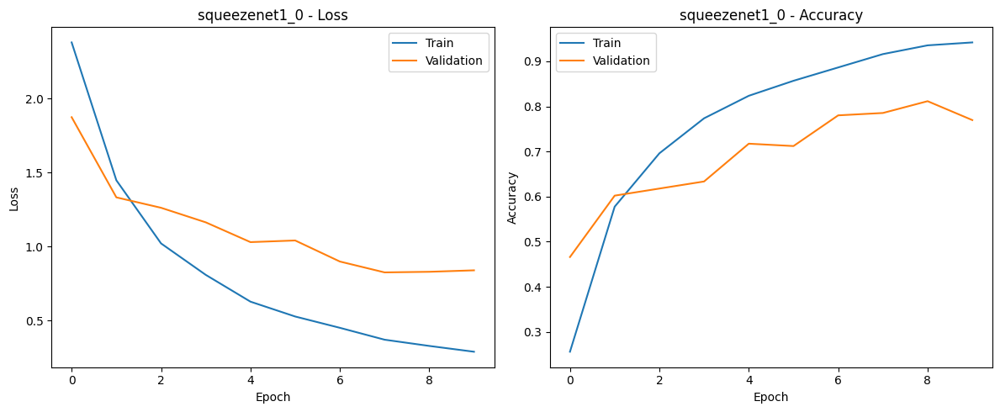

Testing: 100%|██████████| 15/15 [00:02<00:00,  5.06it/s]


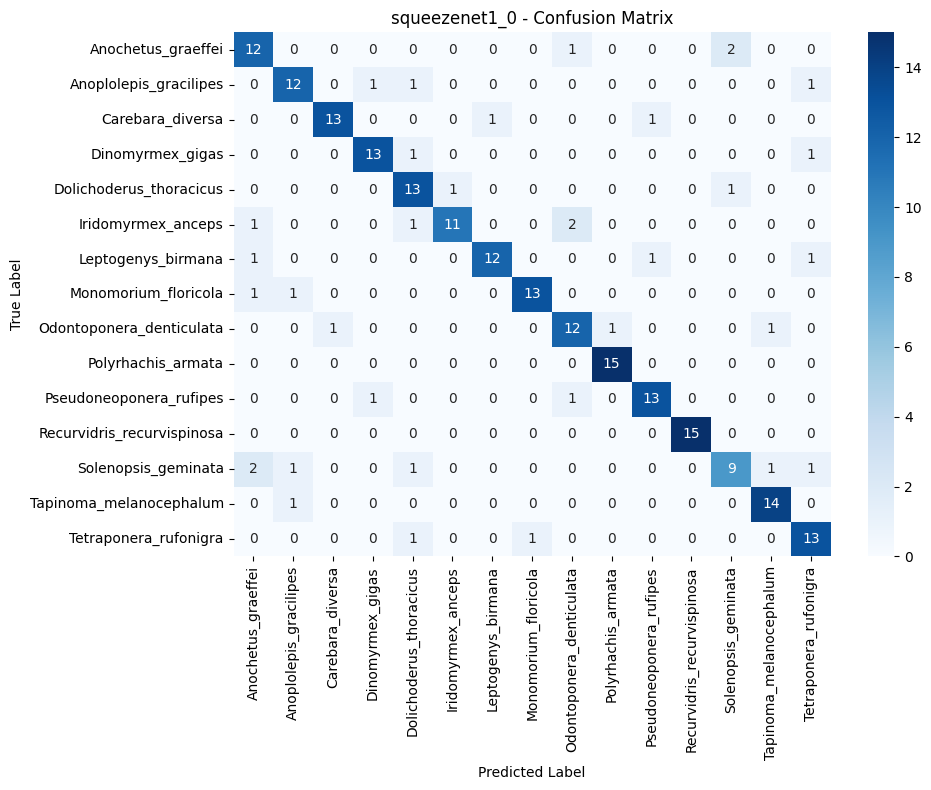


squeezenet1_0 Test Accuracy: 0.8444

Classification Report:
                            precision    recall  f1-score     support
Anochetus_graeffei           0.705882  0.800000  0.750000   15.000000
Anoplolepis_gracilipes       0.800000  0.800000  0.800000   15.000000
Carebara_diversa             0.928571  0.866667  0.896552   15.000000
Dinomyrmex_gigas             0.866667  0.866667  0.866667   15.000000
Dolichoderus_thoracicus      0.722222  0.866667  0.787879   15.000000
Iridomyrmex_anceps           0.916667  0.733333  0.814815   15.000000
Leptogenys_birmana           0.923077  0.800000  0.857143   15.000000
Monomorium_floricola         0.928571  0.866667  0.896552   15.000000
Odontoponera_denticulata     0.750000  0.800000  0.774194   15.000000
Polyrhachis_armata           0.937500  1.000000  0.967742   15.000000
Pseudoneoponera_rufipes      0.866667  0.866667  0.866667   15.000000
Recurvidris_recurvispinosa   1.000000  1.000000  1.000000   15.000000
Solenopsis_geminata          

Evaluating: 100%|██████████| 12/12 [00:02<00:00,  5.38it/s]


Epoch 1/10 - Train Loss: 2.3941, Train Acc: 0.2671, Val Loss: 2.0944, Val Acc: 0.3613


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  5.55it/s]


Epoch 2/10 - Train Loss: 1.7336, Train Acc: 0.5545, Val Loss: 1.8018, Val Acc: 0.4450


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  5.48it/s]


Epoch 3/10 - Train Loss: 1.4038, Train Acc: 0.6516, Val Loss: 1.6366, Val Acc: 0.4764


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  5.99it/s]


Epoch 4/10 - Train Loss: 1.1793, Train Acc: 0.7209, Val Loss: 1.4671, Val Acc: 0.5393


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  5.71it/s]


Epoch 5/10 - Train Loss: 1.0340, Train Acc: 0.7597, Val Loss: 1.3991, Val Acc: 0.5445


Evaluating: 100%|██████████| 12/12 [00:10<00:00,  1.12it/s]


Epoch 6/10 - Train Loss: 0.9625, Train Acc: 0.7708, Val Loss: 1.3875, Val Acc: 0.5550


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.13it/s]


Epoch 7/10 - Train Loss: 0.8565, Train Acc: 0.8031, Val Loss: 1.3264, Val Acc: 0.5497


Evaluating: 100%|██████████| 12/12 [00:02<00:00,  4.16it/s]


Epoch 8/10 - Train Loss: 0.7626, Train Acc: 0.8124, Val Loss: 1.2591, Val Acc: 0.5812


Evaluating: 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]


Epoch 9/10 - Train Loss: 0.7657, Train Acc: 0.8087, Val Loss: 1.2573, Val Acc: 0.5812


Evaluating: 100%|██████████| 12/12 [00:05<00:00,  2.21it/s]


Epoch 10/10 - Train Loss: 0.6952, Train Acc: 0.8364, Val Loss: 1.1966, Val Acc: 0.6126


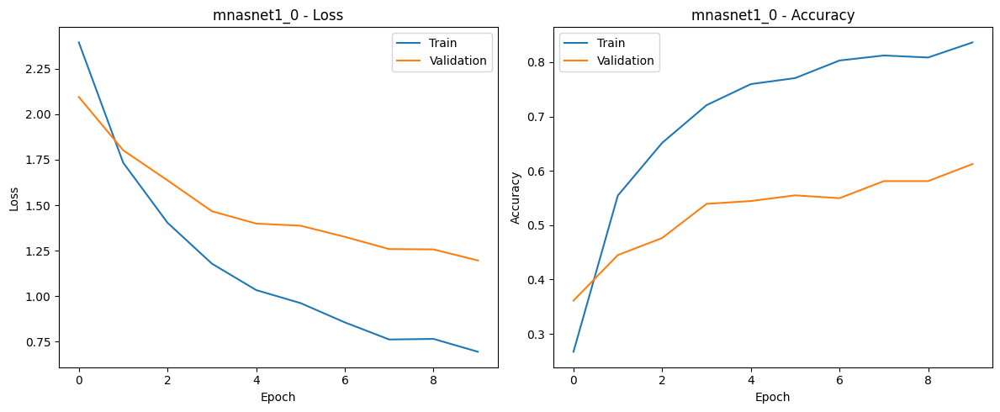

Testing: 100%|██████████| 15/15 [00:06<00:00,  2.24it/s]


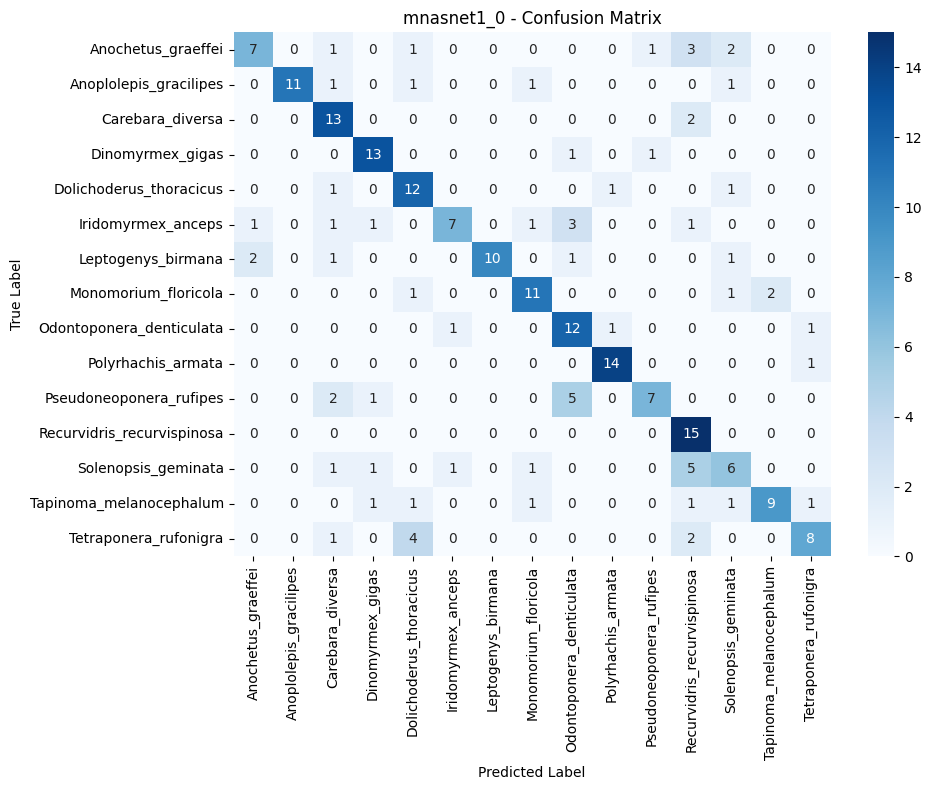


mnasnet1_0 Test Accuracy: 0.6889

Classification Report:
                            precision    recall  f1-score     support
Anochetus_graeffei           0.700000  0.466667  0.560000   15.000000
Anoplolepis_gracilipes       1.000000  0.733333  0.846154   15.000000
Carebara_diversa             0.590909  0.866667  0.702703   15.000000
Dinomyrmex_gigas             0.764706  0.866667  0.812500   15.000000
Dolichoderus_thoracicus      0.600000  0.800000  0.685714   15.000000
Iridomyrmex_anceps           0.777778  0.466667  0.583333   15.000000
Leptogenys_birmana           1.000000  0.666667  0.800000   15.000000
Monomorium_floricola         0.733333  0.733333  0.733333   15.000000
Odontoponera_denticulata     0.545455  0.800000  0.648649   15.000000
Polyrhachis_armata           0.875000  0.933333  0.903226   15.000000
Pseudoneoponera_rufipes      0.777778  0.466667  0.583333   15.000000
Recurvidris_recurvispinosa   0.517241  1.000000  0.681818   15.000000
Solenopsis_geminata          0.4

In [11]:
# Set hyperparameters
num_epochs = 10
learning_rate = 0.001
weight_decay = 1e-4

# Dictionary to store results
results = {}

# Train and evaluate each model
for model_name, model in models_to_train.items():
    print(f"\n{'='*50}\nTraining {model_name}\n{'='*50}")

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    # Fix: Remove verbose parameter
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)

    # Train the model
    trained_model, history = train_model(
        model, train_loader, val_loader, criterion, optimizer, scheduler,
        num_epochs=num_epochs, model_name=model_name
    )

    # Plot training history
    plot_training_history(history, model_name)

    # Test the model
    accuracy, report, cm, all_preds, all_labels = test_model(trained_model, test_loader)

    # Plot confusion matrix
    class_names = [idx_to_species[i] for i in range(len(idx_to_species))]
    plot_confusion_matrix(cm, class_names, model_name)

    # Store results
    results[model_name] = {
        'accuracy': accuracy,
        'report': report,
        'history': history
    }

    print(f"\n{model_name} Test Accuracy: {accuracy:.4f}")
    print("\nClassification Report:")
    print(pd.DataFrame(report).T)

## Results Comparison and Analysis

Model Performance Comparison:
                Model  Accuracy  F1 Score (Macro)
0       squeezenet1_0  0.844444          0.844040
1        mobilenet_v2  0.817778          0.815594
2     efficientnet_b0  0.795556          0.793030
3  mobilenet_v3_small  0.764444          0.764401
4            resnet18  0.733333          0.728631
5          mnasnet1_0  0.688889          0.685135
6          simple_cnn  0.520000          0.513122


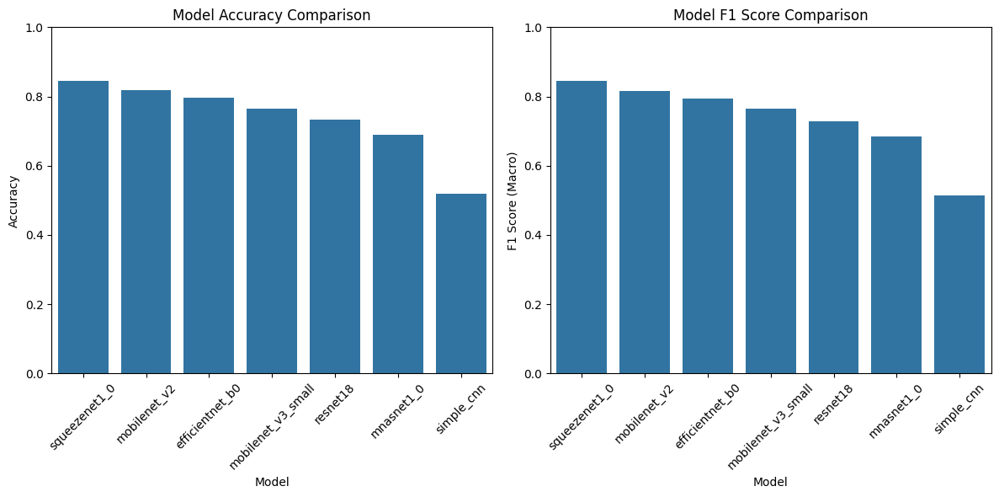


Best performing model: squeezenet1_0
Accuracy: 0.8444
F1 Score: 0.8440


In [12]:
# Compare model performances
model_accuracies = {model_name: results[model_name]['accuracy'] for model_name in results}
model_f1_scores = {model_name: results[model_name]['report']['macro avg']['f1-score'] for model_name in results}

# Create comparison dataframe
comparison_df = pd.DataFrame({
    'Model': list(model_accuracies.keys()),
    'Accuracy': list(model_accuracies.values()),
    'F1 Score (Macro)': list(model_f1_scores.values())
})

# Sort by accuracy
comparison_df = comparison_df.sort_values('Accuracy', ascending=False).reset_index(drop=True)

print("Model Performance Comparison:")
print(comparison_df)

# Plot model comparison
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.barplot(x='Model', y='Accuracy', data=comparison_df)
plt.title('Model Accuracy Comparison')
plt.xticks(rotation=45)
plt.ylim(0, 1)

plt.subplot(1, 2, 2)
sns.barplot(x='Model', y='F1 Score (Macro)', data=comparison_df)
plt.title('Model F1 Score Comparison')
plt.xticks(rotation=45)
plt.ylim(0, 1)

plt.tight_layout()
plt.show()

# Identify best model
best_model_name = comparison_df.iloc[0]['Model']
print(f"\nBest performing model: {best_model_name}")
print(f"Accuracy: {comparison_df.iloc[0]['Accuracy']:.4f}")
print(f"F1 Score: {comparison_df.iloc[0]['F1 Score (Macro)']:.4f}")

## Visualize Model Predictions

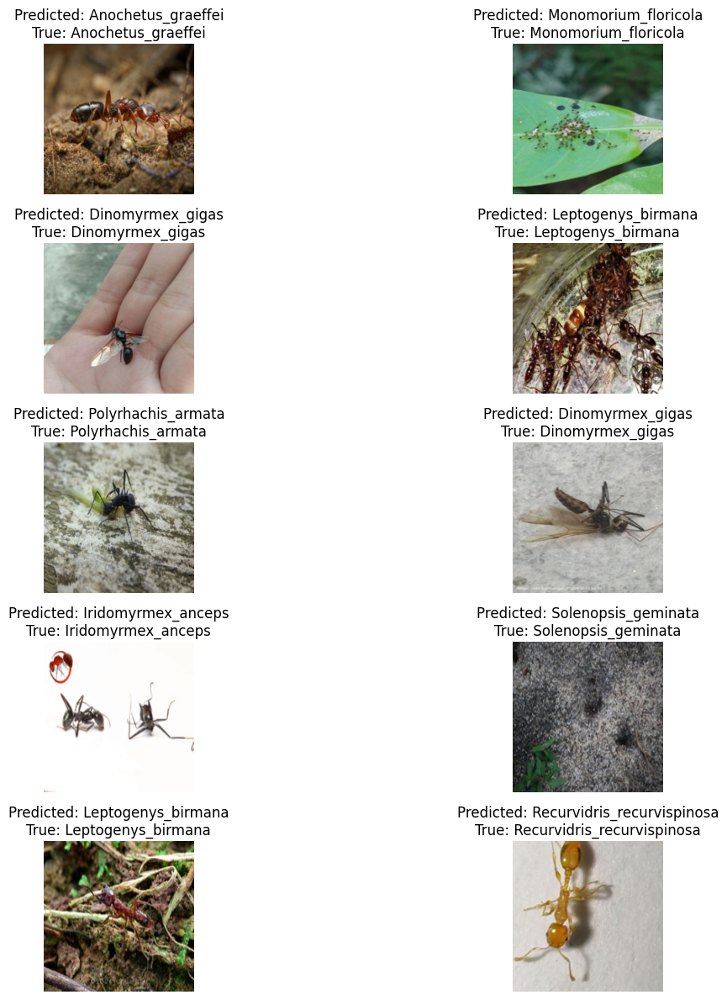

In [13]:
# Load the best model
best_model = models_to_train[best_model_name]
best_model.load_state_dict(torch.load(f"{best_model_name}_best.pth"))
best_model = best_model.to(device)
best_model.eval()

# Function to visualize predictions
def visualize_predictions(model, dataloader, num_images=10):
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(15, 12))
    
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'Predicted: {idx_to_species[preds[j].item()]}\nTrue: {idx_to_species[labels[j].item()]}')
                
                # Denormalize image for display
                img = inputs.cpu().data[j].clone()
                img = img * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
                img = img.numpy().transpose((1, 2, 0))
                img = np.clip(img, 0, 1)
                
                ax.imshow(img)
                
                if images_so_far == num_images:
                    plt.tight_layout()
                    return
    plt.tight_layout()

# Visualize predictions on test set
visualize_predictions(best_model, test_loader)

## Model Saving and Loading

In [14]:
# Save the best model with metadata
def save_model_with_metadata(model, model_name, species_mapping, transform):
    # Save model state dict
    torch.save(model.state_dict(), f"{model_name}_final.pth")
    
    # Save metadata
    metadata = {
        'model_name': model_name,
        'species_mapping': species_mapping,
        'num_classes': len(species_mapping),
        'input_size': (224, 224),
        'normalize_mean': [0.485, 0.456, 0.406],
        'normalize_std': [0.229, 0.224, 0.225]
    }
    
    with open(f"{model_name}_metadata.json", 'w') as f:
        json.dump(metadata, f)
    
    print(f"Model and metadata saved as {model_name}_final.pth and {model_name}_metadata.json")

# Function to load model for inference
def load_model_for_inference(model_name):
    # Load metadata
    with open(f"{model_name}_metadata.json", 'r') as f:
        metadata = json.load(f)
    
    # Create model
    if model_name == 'simple_cnn':
        model = SimpleCNN(num_classes=metadata['num_classes'])
    else:
        model = create_pretrained_model(model_name, num_classes=metadata['num_classes'], freeze_backbone=False)
    
    # Load state dict
    model.load_state_dict(torch.load(f"{model_name}_final.pth"))
    model.eval()
    
    # Create transform
    transform = transforms.Compose([
        transforms.Resize(metadata['input_size']),
        transforms.ToTensor(),
        transforms.Normalize(mean=metadata['normalize_mean'], std=metadata['normalize_std'])
    ])
    
    return model, transform, metadata['species_mapping']

# Save the best model
import json
save_model_with_metadata(best_model, best_model_name, idx_to_species, val_test_transform)

Model and metadata saved as squeezenet1_0_final.pth and squeezenet1_0_metadata.json


## Unit Tests

In [15]:
# Define unit tests
class TestAntSpeciesClassification(unittest.TestCase):
    def setUp(self):
        # Load a small subset of data for testing
        self.test_df = test_df.sample(min(10, len(test_df)))
        self.test_dataset = AntSpeciesDataset(self.test_df, transform=val_test_transform)
        self.test_loader = DataLoader(self.test_dataset, batch_size=2, shuffle=False)
        
        # Load model
        self.model_name = best_model_name
        self.model = models_to_train[self.model_name]
        self.model.load_state_dict(torch.load(f"{self.model_name}_best.pth"))
        self.model = self.model.to(device)
        self.model.eval()
    
    def test_dataset_creation(self):
        """Test that dataset is created correctly"""
        self.assertEqual(len(self.test_dataset), len(self.test_df))
        img, label = self.test_dataset[0]
        self.assertEqual(img.shape, torch.Size([3, 224, 224]))
        self.assertIsInstance(label, int)
    
    def test_model_output_shape(self):
        """Test that model outputs correct shape"""
        with torch.no_grad():
            for inputs, _ in self.test_loader:
                inputs = inputs.to(device)
                outputs = self.model(inputs)
                self.assertEqual(outputs.shape[1], len(species_to_idx))
                break
    
    def test_prediction_pipeline(self):
        """Test the full prediction pipeline"""
        # Get a sample image
        sample_path = self.test_df.iloc[0]['image_path']
        true_species = self.test_df.iloc[0]['species']
        
        # Load and transform image
        image = Image.open(sample_path).convert('RGB')
        image_tensor = val_test_transform(image).unsqueeze(0).to(device)
        
        # Make prediction
        with torch.no_grad():
            outputs = self.model(image_tensor)
            _, preds = torch.max(outputs, 1)
            predicted_species = idx_to_species[preds.item()]
        
        # Check that prediction is a valid species
        self.assertIn(predicted_species, species_to_idx.keys())
    
# Run the tests
unittest.main(argv=['first-arg-is-ignored'], exit=False)

...
----------------------------------------------------------------------
Ran 3 tests in 0.472s

OK


# Model Versioning and Experimentation

In [1]:
import mlflow
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import models, transforms, datasets
from sklearn.metrics import accuracy_score

e:\Antify-ai-component\env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Define dataset and transformations
data_dir = "data/"
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
dataset = datasets.ImageFolder(data_dir, transform=transform)

In [3]:
# Split dataset
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_set, val_set = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32)

In [4]:
# Train & evaluate function
def train_and_evaluate(model, optimizer, criterion, epochs=3):
    model.train()
    for epoch in range(epochs):
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

    model.eval()
    predictions, true_labels = [], []
    with torch.no_grad():
        for inputs, labels in val_loader:
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            predictions.extend(preds.tolist())
            true_labels.extend(labels.tolist())

    acc = accuracy_score(true_labels, predictions)
    return acc

In [5]:
mlflow.set_tracking_uri("file:./mlruns")

In [6]:
experiment_name = "ant_species_identification"
try:
    experiment_id = mlflow.create_experiment(experiment_name)
except:
    experiment_id = mlflow.get_experiment_by_name(experiment_name).experiment_id

mlflow.set_experiment(experiment_name)

<Experiment: artifact_location='file:///e:/Antify-ai-component/mlruns/828397198944162674', creation_time=1747125900800, experiment_id='828397198944162674', last_update_time=1747125900800, lifecycle_stage='active', name='ant_species_identification', tags={}>

In [7]:
# Run experiments with different versions of models
# Replace with actual model names and parameters
results = {}
versions = {
    "squeezenet_v1": {"lr": 0.001, "epochs": 3}, 
    "squeezenet_v2": {"lr": 0.0005, "epochs": 5},
    "squeezenet_v3": {"lr": 0.0001, "epochs": 7},
}

In [9]:
# Import necessary libraries for testing
# Replace with actual model names and parameters
for version_name, params in versions.items():
    with mlflow.start_run(run_name=version_name):
        model = models.squeezenet1_0(pretrained=True) # Example model
        model.classifier[1] = nn.Conv2d(512, len(dataset.classes), kernel_size=1)

        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=params["lr"])

        acc = train_and_evaluate(model, optimizer, criterion, epochs=params["epochs"])

        mlflow.log_param("model", "squeezenet1_0") # Example model
        mlflow.log_param("version", version_name)
        mlflow.log_param("learning_rate", params["lr"])
        mlflow.log_param("epochs", params["epochs"])
        mlflow.log_metric("accuracy", acc)
        mlflow.pytorch.log_model(model, "model")

        results[version_name] = acc

2025/05/13 15:49:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_0_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
2025/05/13 15:53:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model 

In [10]:
# Print final results and select best model
print("\nExperiment Results:")
for version_name, acc in results.items():
    print(f"{version_name}: Accuracy = {acc:.4f}")

best_version = max(results, key=results.get)
print(f"\nBest SqueezeNet Version: {best_version} with Accuracy = {results[best_version]:.4f}")


Experiment Results:
squeezenet_v1: Accuracy = 0.0833
squeezenet_v2: Accuracy = 0.2700
squeezenet_v3: Accuracy = 0.6200

Best SqueezeNet Version: squeezenet_v3 with Accuracy = 0.6200


# Model Explainability

e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Detected 15 classes in the saved model

Explanation for sample 1: data/Tetraponera_rufonigra/Tetraponera_rufonigra_1.jpg


e:\Antify-ai-component\env\Lib\site-packages\captum\attr\_core\guided_backprop_deconvnet.py:64: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


Predicted: Odontoponera_denticulata (Confidence: 0.36)
Ant focus score: 1.98

Top predictions:
- Odontoponera_denticulata: 0.36
- Carebara_diversa: 0.20
- Tetraponera_rufonigra: 0.15

Anatomical region importance:
- Abdomen: 0.13
- Thorax: 0.12
- Legs: 0.10
- Antennae: 0.09
- Head: 0.06

Explanation: This ant is identified as Odontoponera_denticulata with low certainty (35.6%). The model is correctly focusing on the ant's features rather than the background. Alternative possibilities include: Carebara_diversa (19.8%), Tetraponera_rufonigra (14.8%). Taxonomically, Odontoponera_denticulata is known for its large size, toothed petiole.


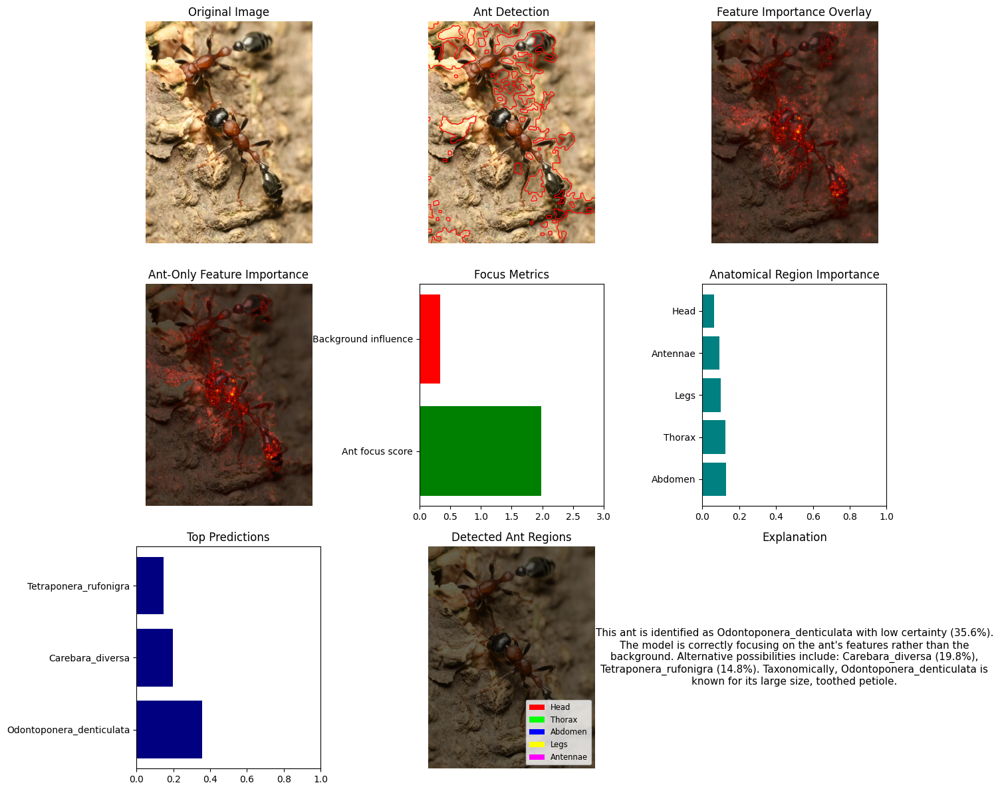


Explanation for sample 2: data/Anoplolepis_gracilipes/Anoplolepis_gracilipes_1.jpg


e:\Antify-ai-component\env\Lib\site-packages\captum\attr\_core\guided_backprop_deconvnet.py:64: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


Predicted: Anoplolepis_gracilipes (Confidence: 1.00)
Ant focus score: 3.64

Top predictions:
- Anoplolepis_gracilipes: 1.00
- Dinomyrmex_gigas: 0.00
- Carebara_diversa: 0.00

Anatomical region importance:
- Thorax: 0.15
- Antennae: 0.12
- Abdomen: 0.11
- Legs: 0.08
- Head: 0.08

Explanation: This ant is identified as Anoplolepis_gracilipes with high certainty (99.5%). The model is correctly focusing on the ant's features rather than the background. Taxonomically, Anoplolepis_gracilipes is known for its long legs, light coloration.


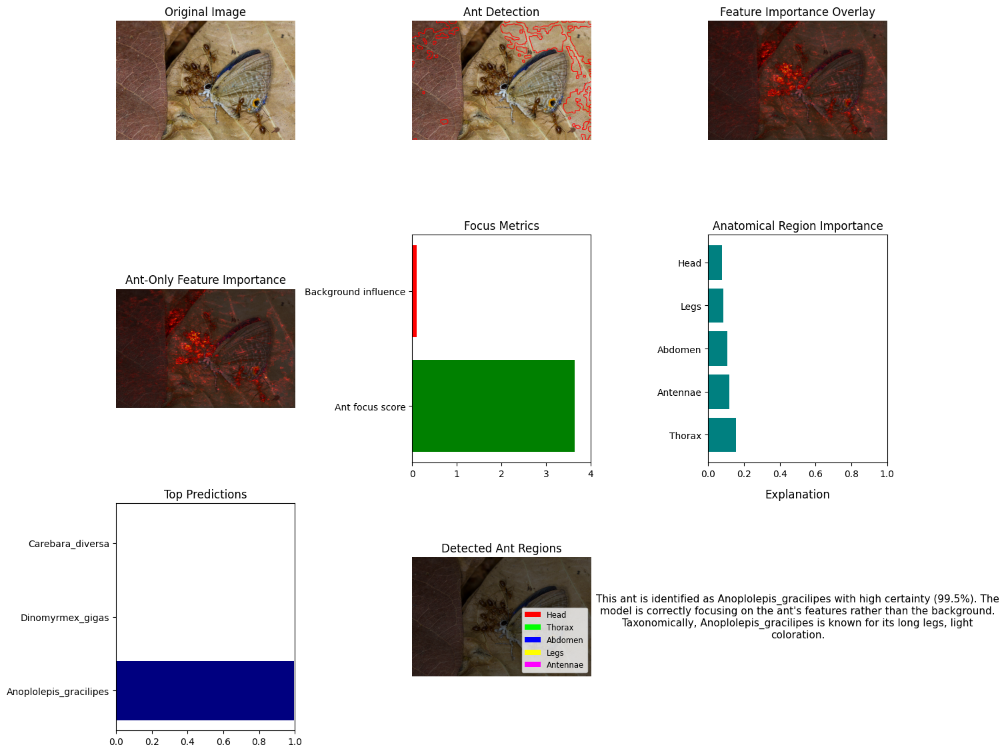


Explanation for sample 3: data/Tapinoma_melanocephalum/Tapinoma_melanocephalum_1.jpg


e:\Antify-ai-component\env\Lib\site-packages\captum\attr\_core\guided_backprop_deconvnet.py:64: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


Predicted: Tapinoma_melanocephalum (Confidence: 0.89)
Ant focus score: 9.02

Top predictions:
- Tapinoma_melanocephalum: 0.89
- Dolichoderus_thoracicus: 0.03
- Carebara_diversa: 0.03

Anatomical region importance:
- Thorax: 0.12
- Antennae: 0.05
- Abdomen: 0.04
- Legs: 0.03
- Head: 0.03

Explanation: This ant is identified as Tapinoma_melanocephalum with high certainty (88.7%). The model is correctly focusing on the ant's features rather than the background. Taxonomically, Tapinoma_melanocephalum is known for its small size, light body with dark head.


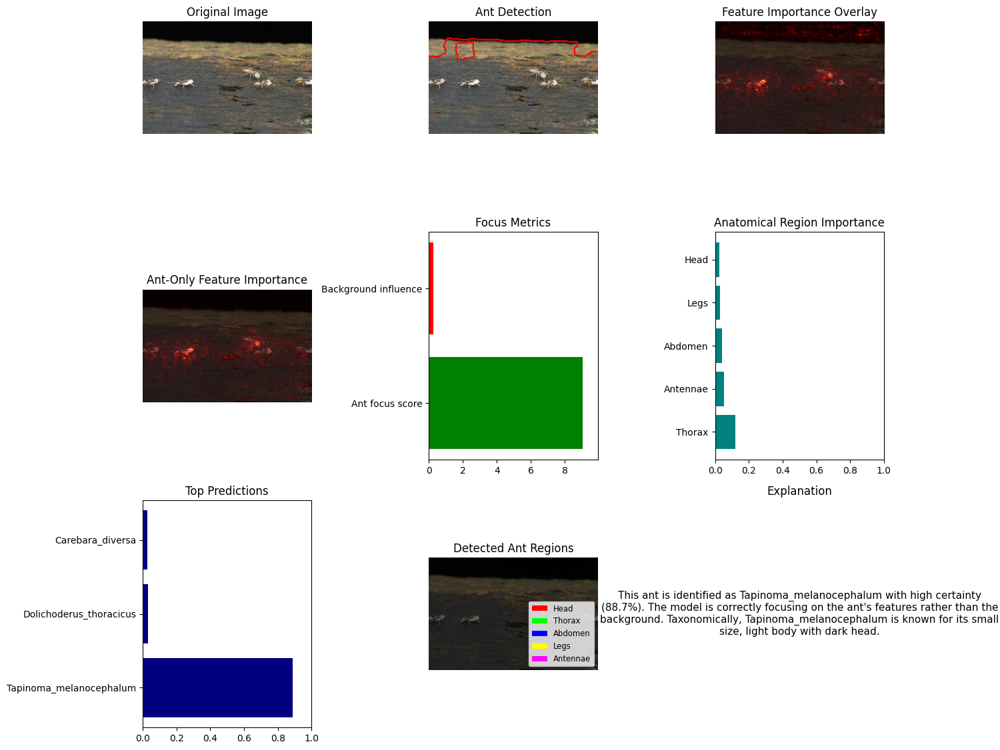

In [23]:
import os
import numpy as np
import torch
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from skimage.segmentation import slic, mark_boundaries
from skimage.measure import regionprops, label
from captum.attr import Saliency, IntegratedGradients, GuidedGradCam
import torch.nn.functional as F

def explain_prediction(model, img_path, class_names, device='cpu'):
    """
    Provides a comprehensive explanation for a model's prediction on an ant image
    with robust detection of ants regardless of their position in the image
    
    Parameters:
        model: The trained model
        img_path: Path to the image to explain
        class_names: List of class names
        device: Device to run inference on ('cpu' or 'cuda')
        
    Returns:
        Dictionary with explanation data
    """
    # Load image
    img = Image.open(img_path).convert('RGB')
    img_np = np.array(img)
    
    # Preprocess image for ant detection using multiple methods
    segmented_img, ant_mask = detect_ant_with_ensemble(img_np)
    
    # Regular preprocessing for model input
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_tensor = transform(img).unsqueeze(0).to(device)
    
    # Get model prediction
    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        confidence, pred_idx = torch.max(probabilities, 1)
        predicted_class = class_names[pred_idx.item()]
        confidence_value = confidence.item()
    
    # Get top 3 predictions
    top_3_prob, top_3_idx = torch.topk(probabilities, 3, dim=1)
    top_3_classes = [class_names[idx.item()] for idx in top_3_idx[0]]
    top_3_confidence = top_3_prob[0].cpu().numpy()
    
    # Apply feature attribution methods
    input_tensor.requires_grad = True
    
    # Get attention maps
    saliency_map, ig_map, gcam_map = get_attribution_maps(model, input_tensor, pred_idx.item())
    
    # Analyze model focus - is it looking at the ant or background?
    ant_focus_stats = analyze_model_focus(saliency_map, ig_map, gcam_map, 
                                          ant_mask, img_np.shape[:2])
    
    # Identify ant body regions based on attribution maps
    regions = identify_ant_regions(img_np, ant_mask, ig_map)
    
    # Generate human-readable explanation
    explanation_text = generate_natural_language_explanation(
        predicted_class, confidence_value, top_3_classes, top_3_confidence,
        ant_focus_stats, regions)
    
    return {
        'predicted_class': predicted_class,
        'confidence': confidence_value,
        'top_3_classes': list(zip(top_3_classes, top_3_confidence)),
        'explanation': explanation_text,
        'saliency_map': saliency_map,
        'integrated_gradients_map': ig_map,
        'gradcam_map': gcam_map,
        'input_image': img,
        'segmented_image': Image.fromarray(segmented_img),
        'ant_mask': ant_mask,
        'ant_focus_stats': ant_focus_stats,
        'regions': regions
    }

def detect_ant_with_ensemble(img_np):
    """
    Uses multiple techniques to detect the ant in an image regardless of position
    
    Args:
        img_np: Input image as numpy array
        
    Returns:
        segmented_img: Image with segmentation highlighted
        ant_mask: Boolean mask where True corresponds to detected ant pixels
    """
    h, w = img_np.shape[:2]
    
    # Method 1: Color-based segmentation
    hsv = cv2.cvtColor(img_np, cv2.COLOR_RGB2HSV)
    
    # Method 2: Superpixel segmentation with SLIC
    segments = slic(img_np, n_segments=100, compactness=10)
    segment_mask = np.zeros((h, w), dtype=bool)
    
    # For each segment, determine if it's likely part of the ant
    for segment_id in np.unique(segments):
        mask = segments == segment_id
        # Calculate segment properties
        avg_hsv = [np.mean(hsv[:,:,i][mask]) for i in range(3)]
        std_hsv = [np.std(hsv[:,:,i][mask]) for i in range(3)]
        size = np.sum(mask)
        
        # Heuristic: ants generally have:
        # - Higher texture (std_s > threshold)
        # - Not too bright (avg_v not too high)
        # - Not too large or too small
        if ((std_hsv[1] > 10 or std_hsv[0] > 15) and 
            avg_hsv[2] < 220 and 
            0.001 < size/(h*w) < 0.5):
            segment_mask |= mask
    
    # Method 3: Edge detection to find contours (ants usually have distinct edges)
    gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    edge_density = cv2.dilate(edges, None, iterations=2) > 0
    
    # Method 4: Foreground extraction using grabCut
    grabcut_mask = np.zeros(img_np.shape[:2], dtype=np.uint8)
    grabcut_mask[:] = cv2.GC_PR_BGD  # All pixels are initially possible background
    # Mark central region as possible foreground (ants are often in the center)
    center_margin = 0.2
    grabcut_mask[int(h*center_margin):int(h*(1-center_margin)), 
                int(w*center_margin):int(w*(1-center_margin))] = cv2.GC_PR_FGD
    
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    try:
        # GrabCut can fail on some images
        cv2.grabCut(img_np, grabcut_mask, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)
        grabcut_mask = np.isin(grabcut_mask, [cv2.GC_FGD, cv2.GC_PR_FGD])
    except:
        # Fallback: just use the center prior
        grabcut_mask = grabcut_mask == cv2.GC_PR_FGD
    
    # Combine methods using an ensemble approach
    ant_mask = segment_mask & (edge_density | grabcut_mask)
    
    # Clean up the mask with morphological operations
    kernel = np.ones((5, 5), np.uint8)
    ant_mask = cv2.morphologyEx(ant_mask.astype(np.uint8), cv2.MORPH_OPEN, kernel)
    ant_mask = cv2.morphologyEx(ant_mask, cv2.MORPH_CLOSE, kernel)
    
    # Keep only the largest connected component - likely to be the ant
    labeled = label(ant_mask)
    regions = regionprops(labeled)
    if regions:
        largest_region_label = max(regions, key=lambda r: r.area).label
        ant_mask = labeled == largest_region_label
    
    # If we couldn't find any good ant segments, use a fallback
    if np.sum(ant_mask) < 100:
        print("Warning: Ant detection might be unreliable, using fallback detection")
        # Try a simpler approach as fallback - detect dark, non-background colored regions
        mask = (gray < np.percentile(gray, 40)) & (std_hsv[1] > 5)
        ant_mask = cv2.morphologyEx(mask.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    
    # Create visualization image with the ant segments highlighted
    segmented_img = mark_boundaries(img_np, ant_mask.astype(int), color=(1, 0, 0), mode='thick')
    segmented_img = (segmented_img * 255).astype(np.uint8)
    
    return segmented_img, ant_mask

def get_attribution_maps(model, input_tensor, target_class):
    """
    Get attribution maps using multiple methods
    """
    # 1. Saliency maps
    saliency = Saliency(model)
    saliency_attr = saliency.attribute(input_tensor, target=target_class)
    saliency_map = saliency_attr.squeeze().cpu().detach().numpy()
    saliency_map = np.abs(saliency_map).mean(axis=0)
    
    # 2. Integrated Gradients
    ig = IntegratedGradients(model)
    ig_attr = ig.attribute(input_tensor, target=target_class, n_steps=50)
    ig_map = ig_attr.squeeze().cpu().detach().numpy()
    ig_map = np.abs(ig_map).mean(axis=0)
    
    # 3. GradCAM
    # Find the last convolutional layer for GradCAM
    last_conv_layer = None
    for name, module in reversed(list(model.named_modules())):
        if isinstance(module, torch.nn.Conv2d):
            last_conv_layer = module
            last_conv_name = name
            break
    
    if last_conv_layer is not None:
        gcam = GuidedGradCam(model, last_conv_layer)
        gcam_attr = gcam.attribute(input_tensor, target=target_class)
        gcam_map = gcam_attr.squeeze().cpu().detach().numpy()
        gcam_map = np.abs(gcam_map).mean(axis=0)
    else:
        # Fallback if no conv layer is found
        gcam_map = np.zeros_like(ig_map)
    
    # Normalize maps for visualization
    saliency_map = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min() + 1e-8)
    ig_map = (ig_map - ig_map.min()) / (ig_map.max() - ig_map.min() + 1e-8)
    gcam_map = (gcam_map - gcam_map.min()) / (gcam_map.max() - gcam_map.min() + 1e-8)
    
    return saliency_map, ig_map, gcam_map

def analyze_model_focus(saliency_map, ig_map, gcam_map, ant_mask, img_shape):
    """
    Analyze whether the model is focusing on the ant or the background
    
    Returns:
        Dict with focus metrics
    """
    # Resize masks if needed
    if saliency_map.shape != ant_mask.shape:
        ant_mask_resized = cv2.resize(ant_mask.astype(np.float32), 
                                     (saliency_map.shape[1], saliency_map.shape[0]))
        ant_mask_resized = ant_mask_resized > 0.5
    else:
        ant_mask_resized = ant_mask
    
    # Calculate focus metrics
    ant_area_ratio = np.mean(ant_mask_resized)
    
    # For each attribution map, calculate:
    # 1. How much of the attribution is on the ant vs background
    # 2. Attribution density on ant vs background
    metrics = {}
    
    for name, attr_map in [('saliency', saliency_map), 
                           ('integrated_gradients', ig_map), 
                           ('gradcam', gcam_map)]:
        # Total attribution
        total_attr = np.sum(attr_map)
        if total_attr > 0:
            # Attribution on ant
            ant_attr = np.sum(attr_map * ant_mask_resized)
            # Attribution percentage on ant
            ant_attr_pct = ant_attr / total_attr
            
            # Ant attribution density (how concentrated the attribution is on the ant)
            ant_density = ant_attr / max(np.sum(ant_mask_resized), 1)
            
            # Background attribution density
            bg_mask = ~ant_mask_resized
            bg_attr = np.sum(attr_map * bg_mask)
            bg_density = bg_attr / max(np.sum(bg_mask), 1)
            
            # Attribution ratio (ant density / background density)
            # Values > 1 mean the model focuses more on the ant
            attr_ratio = ant_density / max(bg_density, 1e-10)
            
            metrics[f'{name}_ant_pct'] = float(ant_attr_pct)
            metrics[f'{name}_ant_density'] = float(ant_density)
            metrics[f'{name}_attr_ratio'] = float(attr_ratio)
        else:
            metrics[f'{name}_ant_pct'] = 0
            metrics[f'{name}_ant_density'] = 0
            metrics[f'{name}_attr_ratio'] = 0
    
    # Aggregate focus score (average of attribution ratios)
    focus_ratios = [metrics['saliency_attr_ratio'], 
                   metrics['integrated_gradients_attr_ratio'],
                   metrics['gradcam_attr_ratio']]
    metrics['aggregate_focus_score'] = float(np.mean(focus_ratios))
    
    # Interpretation
    metrics['ant_area_ratio'] = float(ant_area_ratio)
    metrics['is_focused_on_ant'] = metrics['aggregate_focus_score'] > 1.0
    
    return metrics

def identify_ant_regions(img_np, ant_mask, importance_map):
    """
    Identify different parts of the ant based on the segmentation mask and
    attribution maps. Handles ants in any position or orientation.
    """
    # Resize masks if needed to match the importance map dimensions
    if importance_map.shape != ant_mask.shape:
        h, w = importance_map.shape
        ant_mask_resized = cv2.resize(ant_mask.astype(np.float32), (w, h)) > 0.5
    else:
        ant_mask_resized = ant_mask
        h, w = ant_mask.shape
    
    # Find contour of the ant
    ant_contour = None
    try:
        contours, _ = cv2.findContours(ant_mask_resized.astype(np.uint8), 
                                       cv2.RETR_EXTERNAL, 
                                       cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            ant_contour = max(contours, key=cv2.contourArea)
    except:
        # Fallback if contour finding fails
        pass
    
    # If we found a contour, use it to identify regions based on position
    if ant_contour is not None:
        # Find bounding box and orientation
        x, y, w_box, h_box = cv2.boundingRect(ant_contour)
        # Find centroid
        M = cv2.moments(ant_contour)
        if M["m00"] > 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
        else:
            cx, cy = x + w_box//2, y + h_box//2
        
        # Determine orientation using the longest axis (PCA-like approach)
        orientation = 0  # Default horizontal
        if len(ant_contour) > 5:  # Need at least 5 points for ellipse fitting
            try:
                _, (major, minor), angle = cv2.fitEllipse(ant_contour)
                orientation = angle
            except:
                # Fallback if ellipse fitting fails
                orientation = 0 if w_box > h_box else 90
        else:
            orientation = 0 if w_box > h_box else 90
            
        # Create region maps based on position and orientation
        regions = {}
        
        # Create empty masks for each region
        for region in ['head', 'thorax', 'abdomen', 'legs', 'antennae']:
            regions[region] = np.zeros((h, w), dtype=bool)
        
        # If ant is roughly horizontal
        if abs(orientation - 0) < 45 or abs(orientation - 180) < 45:
            # Left is head, right is abdomen
            left_boundary = x + w_box // 3
            right_boundary = x + 2 * w_box // 3
            
            head_mask = ant_mask_resized.copy()
            head_mask[:, left_boundary:] = False
            
            thorax_mask = ant_mask_resized.copy()
            thorax_mask[:, :left_boundary] = False
            thorax_mask[:, right_boundary:] = False
            
            abdomen_mask = ant_mask_resized.copy()
            abdomen_mask[:, :right_boundary] = False
            
            regions['head'] = head_mask
            regions['thorax'] = thorax_mask
            regions['abdomen'] = abdomen_mask
            
        # If ant is roughly vertical
        else:
            # Top is head, bottom is abdomen
            top_boundary = y + h_box // 3
            bottom_boundary = y + 2 * h_box // 3
            
            head_mask = ant_mask_resized.copy()
            head_mask[top_boundary:, :] = False
            
            thorax_mask = ant_mask_resized.copy()
            thorax_mask[:top_boundary, :] = False
            thorax_mask[bottom_boundary:, :] = False
            
            abdomen_mask = ant_mask_resized.copy()
            abdomen_mask[:bottom_boundary, :] = False
            
            regions['head'] = head_mask
            regions['thorax'] = thorax_mask
            regions['abdomen'] = abdomen_mask
            
        # Try to identify legs from the contour
        legs_mask = cv2.dilate(ant_mask_resized.astype(np.uint8), np.ones((3,3))) & (~ant_mask_resized)
        regions['legs'] = legs_mask > 0
        
        # Approximate antennae as being near the head and having small width
        antennae_mask = cv2.dilate(regions['head'].astype(np.uint8), np.ones((5,5))) & (~regions['head'])
        regions['antennae'] = antennae_mask > 0
    else:
        # Fallback: divide ant into approximate regions using simple division
        # Since we don't know orientation, use concentric regions from center
        y_indices, x_indices = np.where(ant_mask_resized)
        if len(y_indices) > 0 and len(x_indices) > 0:
            cy, cx = np.mean(y_indices), np.mean(x_indices)
            max_dist = np.sqrt(np.max(np.square(y_indices - cy) + np.square(x_indices - cx)))
            
            # Create masks based on distance from center
            dist_mask = np.zeros_like(ant_mask_resized, dtype=float)
            for i in range(h):
                for j in range(w):
                    if ant_mask_resized[i, j]:
                        dist_mask[i, j] = np.sqrt((i - cy)**2 + (j - cx)**2) / max_dist
            
            thorax_mask = ant_mask_resized & (dist_mask < 0.33)
            abdomen_mask = ant_mask_resized & (dist_mask >= 0.33) & (dist_mask < 0.66)
            head_mask = ant_mask_resized & (dist_mask >= 0.66)
            
            # Try to identify legs from the edge
            legs_mask = cv2.dilate(ant_mask_resized.astype(np.uint8), np.ones((3,3))) & (~ant_mask_resized)
            
            regions = {
                'head': head_mask,
                'thorax': thorax_mask,
                'abdomen': abdomen_mask, 
                'legs': legs_mask > 0,
                'antennae': np.zeros_like(ant_mask_resized)  # Can't reliable detect in fallback
            }
        else:
            # Empty masks if no ant pixels
            regions = {region: np.zeros_like(ant_mask_resized) for region in 
                       ['head', 'thorax', 'abdomen', 'legs', 'antennae']}
    
    # Calculate importance scores for each region
    region_scores = {}
    for region_name, region_mask in regions.items():
        # Skip if region is empty
        if np.sum(region_mask) == 0:
            region_scores[region_name] = 0
            continue
        
        # Calculate average importance in region
        region_importance = np.sum(importance_map * region_mask) / np.sum(region_mask)
        # Scale for better interpretability
        region_scores[region_name] = min(1.0, region_importance * 2.5)
    
    return region_scores

def generate_natural_language_explanation(predicted_class, confidence, 
                                         top_3_classes, top_3_confidence,
                                         focus_stats, regions):
    """
    Generate a natural language explanation of the model's prediction
    """
    # Determine confidence level description
    if confidence > 0.8:
        certainty = "high certainty"
    elif confidence > 0.6:
        certainty = "good certainty"
    elif confidence > 0.4:
        certainty = "moderate certainty"
    else:
        certainty = "low certainty"
    
    # Basic prediction statement
    explanation = f"This ant is identified as {predicted_class} with {certainty} ({confidence:.1%}). "
    
    # Add focus information
    if focus_stats['is_focused_on_ant']:
        explanation += "The model is correctly focusing on the ant's features rather than the background. "
    else:
        explanation += "Note: The model may be partially influenced by background elements in the image. "
    
    # Add anatomical region information
    important_regions = [(r, s) for r, s in regions.items() if s > 0.5]
    if important_regions:
        important_regions.sort(key=lambda x: x[1], reverse=True)
        top_regions = important_regions[:2]  # Only mention top 2 regions
        regions_text = ", ".join([f"{r} (importance: {s:.2f})" for r, s in top_regions])
        explanation += f"The key anatomical features for identification are: {regions_text}. "
    
    # Add alternatives for lower confidence predictions
    if confidence < 0.7:
        alternatives = ", ".join([f"{cls} ({conf:.1%})" for cls, conf in 
                                 zip(top_3_classes[1:3], top_3_confidence[1:3])])
        explanation += f"Alternative possibilities include: {alternatives}. "
    
    # Add taxonomic information based on class
    taxonomy_features = {
        'Tetraponera_rufonigra': "elongated body, distinct petiole",
        'Anoplolepis_gracilipes': "long legs, light coloration",
        'Anochetus_graeffei': "trap jaw mandibles, slim thorax",
        'Tapinoma_melanocephalum': "small size, light body with dark head",
        'Recurvidris_recurvispinosa': "curved spines on propodeum",
        'Carebara_diversa': "major and minor workers with size dimorphism",
        'Odontoponera_denticulata': "large size, toothed petiole",
        'Polyrhachis_armata': "distinct spines on thorax",
        'Solenopsis_geminata': "fire ant with potent sting"
    }
    
    taxonomic_desc = taxonomy_features.get(predicted_class, "distinctive morphological features")
    explanation += f"Taxonomically, {predicted_class} is known for its {taxonomic_desc}."
    
    return explanation

def visualize_explanation_with_position_invariance(explanation):
    """
    Visualizes the explanation including ant segmentation and feature importance
    with position-invariant analysis
    """
    # Setup the figure
    fig = plt.figure(figsize=(15, 12))
    
    # 1. Original image and ant segmentation
    ax1 = plt.subplot(3, 3, 1)
    ax1.imshow(explanation['input_image'])
    ax1.set_title("Original Image")
    ax1.axis('off')
    
    ax2 = plt.subplot(3, 3, 2)
    ax2.imshow(explanation['segmented_image'])
    ax2.set_title("Ant Detection")
    ax2.axis('off')
    
    # 2. Overlay of attribution on the image
    ax3 = plt.subplot(3, 3, 3)
    img_np = np.array(explanation['input_image'])
    ax3.imshow(img_np)
    
    # Resize if needed
    h, w = img_np.shape[:2]
    ig_map_resized = cv2.resize(explanation['integrated_gradients_map'], (w, h))
    im3 = ax3.imshow(ig_map_resized, cmap='hot', alpha=0.7)
    ax3.set_title("Feature Importance Overlay")
    ax3.axis('off')
    
    # 3. Ant-focused attribution (attribution only on the ant regions)
    ax4 = plt.subplot(3, 3, 4)
    
    # Create ant-focused attribution map
    ant_mask_resized = cv2.resize(explanation['ant_mask'].astype(np.float32), (w, h)) > 0.5
    ant_focused_attr = ig_map_resized * ant_mask_resized
    
    # Display
    ax4.imshow(img_np)
    im4 = ax4.imshow(ant_focused_attr, cmap='hot', alpha=0.7)
    ax4.set_title("Ant-Only Feature Importance")
    ax4.axis('off')
    
    # 4. Bar chart of focus metrics
    ax5 = plt.subplot(3, 3, 5)
    focus_metrics = [
        ('Ant focus score', explanation['ant_focus_stats']['aggregate_focus_score']),
        ('Background influence', 1.0 - explanation['ant_focus_stats'].get('integrated_gradients_ant_pct', 0))
    ]
    metric_names = [m[0] for m in focus_metrics]
    metric_values = [m[1] for m in focus_metrics]
    # Use colors based on values
    colors = ['green' if m[0] == 'Ant focus score' else 'red' for m in focus_metrics]
    
    y_pos = np.arange(len(metric_names))
    ax5.barh(y_pos, metric_values, color=colors)
    ax5.set_yticks(y_pos)
    ax5.set_yticklabels(metric_names)
    ax5.set_title("Focus Metrics")
    ax5.set_xlim(0, max(3.0, max(metric_values) * 1.1))
    
    # 5. Bar chart of anatomical region importance
    ax6 = plt.subplot(3, 3, 6)
    regions = explanation['regions']
    # Sort by importance score
    sorted_regions = sorted(regions.items(), key=lambda x: x[1], reverse=True)
    region_names = [r[0].capitalize() for r in sorted_regions]
    region_scores = [r[1] for r in sorted_regions]
    
    y_pos = np.arange(len(region_names))
    ax6.barh(y_pos, region_scores, color='teal')
    ax6.set_yticks(y_pos)
    ax6.set_yticklabels(region_names)
    ax6.set_title("Anatomical Region Importance")
    ax6.set_xlim(0, 1)
    
    # 6. Bar chart of top class probabilities
    ax7 = plt.subplot(3, 3, 7)
    top_classes = [c for c, _ in explanation['top_3_classes']]
    top_probs = [p for _, p in explanation['top_3_classes']]
    
    y_pos = np.arange(len(top_classes))
    ax7.barh(y_pos, top_probs, color='navy')
    ax7.set_yticks(y_pos)
    ax7.set_yticklabels(top_classes)
    ax7.set_title("Top Predictions")
    ax7.set_xlim(0, 1)
    
    # 7. Visualization of the detected regions (optional)
    # This shows how the model segments different parts of the ant
    ax8 = plt.subplot(3, 3, 8)
    region_overlay = np.zeros((h, w, 3))
    
    colors = {
        'head': [1.0, 0.0, 0.0],      # Red
        'thorax': [0.0, 1.0, 0.0],    # Green
        'abdomen': [0.0, 0.0, 1.0],   # Blue
        'legs': [1.0, 1.0, 0.0],      # Yellow
        'antennae': [1.0, 0.0, 1.0]   # Magenta
    }
    
    # Create a colored overlay showing the different regions
    for region_name, color in colors.items():
        if region_name in explanation['regions'] and explanation['regions'][region_name] > 0.3:
            mask_resized = cv2.resize(
                explanation['ant_mask'].astype(np.float32) * 
                (region_name == 'head' or region_name == 'thorax' or region_name == 'abdomen'), 
                (w, h)
            )
            for i in range(3):
                region_overlay[:, :, i] += mask_resized * color[i] * 0.7
    
    # Show the colored regions overlaid on the image
    ax8.imshow(img_np)
    ax8.imshow(np.clip(region_overlay, 0, 1), alpha=0.6)
    ax8.set_title("Detected Ant Regions")
    ax8.axis('off')
    
    # Add a legend for the regions
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor=colors[r], label=r.capitalize()) 
                      for r in ['head', 'thorax', 'abdomen', 'legs', 'antennae']]
    ax8.legend(handles=legend_elements, loc='lower right', fontsize='small')
    
    # 8. Text explanation
    ax9 = plt.subplot(3, 3, 9)
    ax9.text(0.5, 0.5, explanation['explanation'], 
             ha='center', va='center', wrap=True,
             fontsize=11)
    ax9.axis('off')
    ax9.set_title("Explanation")
    
    plt.tight_layout()
    return fig

# Function to run explanations on sample images
def run_position_invariant_explanations(model, model_path, class_names, device='cpu'):
    """
    Run explanations on sample images with position-invariant ant detection
    """
    # Try to load the model
    try:
        state_dict = torch.load(model_path, map_location=device)
        
        # Detect the number of classes
        if 'classifier.1.weight' in state_dict:
            num_classes = state_dict['classifier.1.weight'].size(0)
            print(f"Detected {num_classes} classes in the saved model")
            
            # Create the model and load weights
            model = models.squeezenet1_0(pretrained=False)
            model.classifier[1] = torch.nn.Conv2d(512, num_classes, kernel_size=1)
            model.load_state_dict(state_dict)
            model = model.to(device)
            
            # Check class names match
            if len(class_names) != num_classes:
                print(f"Warning: {len(class_names)} class names provided but model has {num_classes} classes.")
                # Try to infer class names from data directory
                try:
                    data_folders = sorted([f for f in os.listdir('data/') 
                                          if os.path.isdir(os.path.join('data/', f))])
                    if len(data_folders) >= num_classes:
                        class_names = data_folders[:num_classes]
                    else:
                        known_species = [
                            'Tetraponera_rufonigra', 'Anoplolepis_gracilipes', 'Anochetus_graeffei', 
                            'Tapinoma_melanocephalum', 'Recurvidris_recurvispinosa'
                        ]
                        class_names = known_species[:num_classes]
                        if len(class_names) < num_classes:
                            for i in range(len(class_names), num_classes):
                                class_names.append(f"Ant_Species_{i+1}")
                except Exception as e:
                    print(f"Error inferring class names: {e}")
                    class_names = [f"Ant_Species_{i+1}" for i in range(num_classes)]
    except Exception as e:
        print(f"Error loading model: {e}")
        return
    
    # Define sample paths
    sample_paths = [
        'data/Tetraponera_rufonigra/Tetraponera_rufonigra_1.jpg',
        'data/Anoplolepis_gracilipes/Anoplolepis_gracilipes_1.jpg',
        'data/Tapinoma_melanocephalum/Tapinoma_melanocephalum_1.jpg'
    ]
    
    # Try to find the actual data directory
    try:
        if not os.path.exists(sample_paths[0]):
            # Try to find the data directory
            data_dir = None
            for potential_dir in ['data', 'data/', '../data', './data']:
                if os.path.isdir(potential_dir):
                    species_folders = [f for f in os.listdir(potential_dir) 
                                      if os.path.isdir(os.path.join(potential_dir, f))]
                    if species_folders:
                        data_dir = potential_dir
                        break
                        
            if data_dir:
                # Update sample paths with actual data
                sample_paths = []
                for species_folder in os.listdir(data_dir)[:3]:  # First 3 species
                    species_dir = os.path.join(data_dir, species_folder)
                    if os.path.isdir(species_dir):
                        image_files = [f for f in os.listdir(species_dir) 
                                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
                        if image_files:
                            sample_paths.append(os.path.join(species_dir, image_files[0]))
    except Exception as e:
        print(f"Error finding sample images: {e}")
    
    # Process each sample image
    for i, img_path in enumerate(sample_paths):
        try:
            if not os.path.exists(img_path):
                print(f"Warning: Sample image {img_path} not found, skipping.")
                continue
                
            print(f"\nExplanation for sample {i+1}: {img_path}")
            explanation = explain_prediction(model, img_path, class_names, device)
            
            # Print key information
            print(f"Predicted: {explanation['predicted_class']} (Confidence: {explanation['confidence']:.2f})")
            print(f"Ant focus score: {explanation['ant_focus_stats']['aggregate_focus_score']:.2f}")
            
            print("\nTop predictions:")
            for cls, conf in explanation['top_3_classes']:
                print(f"- {cls}: {conf:.2f}")
                
            print("\nAnatomical region importance:")
            for region, score in sorted(explanation['regions'].items(), key=lambda x: x[1], reverse=True):
                print(f"- {region.capitalize()}: {score:.2f}")
                
            print(f"\nExplanation: {explanation['explanation']}")
            
            # Visualize the explanation
            fig = visualize_explanation_with_position_invariance(explanation)
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error processing sample {img_path}: {e}")
            import traceback
            traceback.print_exc()

# Example usage
if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_path = 'squeezenet1_0_best.pth'
    
    # Fallback class names if needed
    class_names = [
        'Tetraponera_rufonigra', 'Anoplolepis_gracilipes', 'Anochetus_graeffei', 
        'Tapinoma_melanocephalum', 'Recurvidris_recurvispinosa'
    ]
    
    # Initialize model (weights will be loaded in the function)
    model = models.squeezenet1_0(pretrained=False)
    model.classifier[1] = torch.nn.Conv2d(512, len(class_names), kernel_size=1)
    
    # Run explanations with position-invariant analysis
    run_position_invariant_explanations(model, model_path, class_names, device)

# Prediction Reasoning

e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
e:\Antify-ai-component\env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Detected 15 classes in the saved model
Using folder names or inferred species names.

Explanation for sample 1: data/Tetraponera_rufonigra/Tetraponera_rufonigra_1.jpg
Predicted: Odontoponera_denticulata (Confidence: 0.36)

Top predictions:
- Odontoponera_denticulata: 0.36
- Carebara_diversa: 0.20
- Tetraponera_rufonigra: 0.15

Feature importance level: 0.0051

Explanation: This ant is identified as Odontoponera_denticulata with low certainty (35.6%). The identification is based on subtle distinguishing features detected in the image. Taxonomically, this species is known for its distinctive body structure. Alternative species that this could be: Carebara_diversa (19.8%), Tetraponera_rufonigra (14.8%).


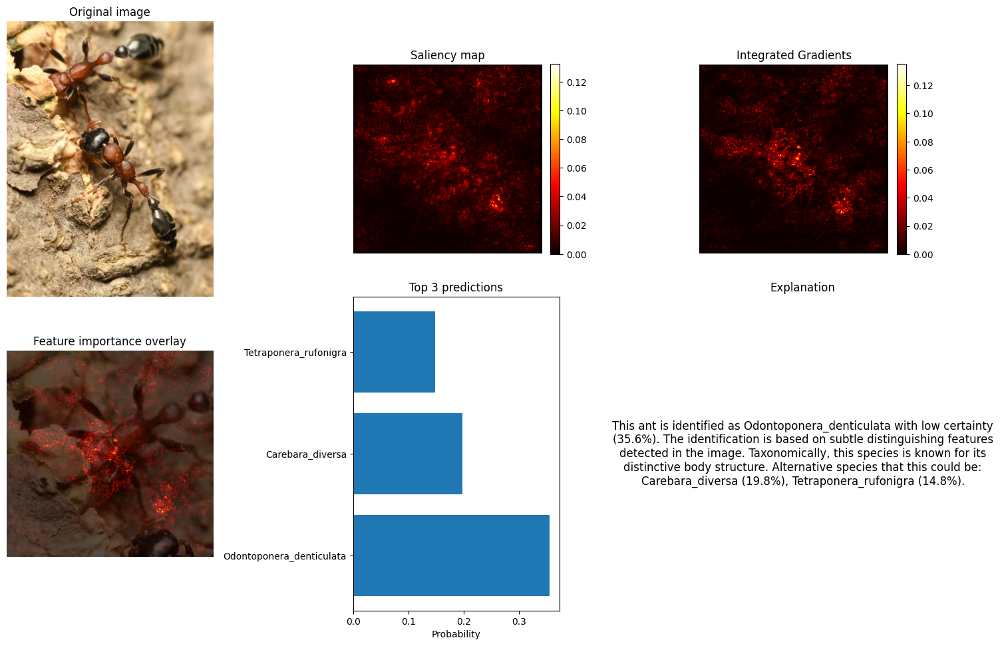


Explanation for sample 2: data/Anoplolepis_gracilipes/Anoplolepis_gracilipes_1.jpg
Predicted: Anoplolepis_gracilipes (Confidence: 1.00)

Top predictions:
- Anoplolepis_gracilipes: 1.00
- Dinomyrmex_gigas: 0.00
- Carebara_diversa: 0.00

Feature importance level: 0.0056

Explanation: This ant is identified as Anoplolepis_gracilipes with high certainty (99.5%). The identification is based on subtle distinguishing features detected in the image. Taxonomically, this species is known for its long legs, light coloration.


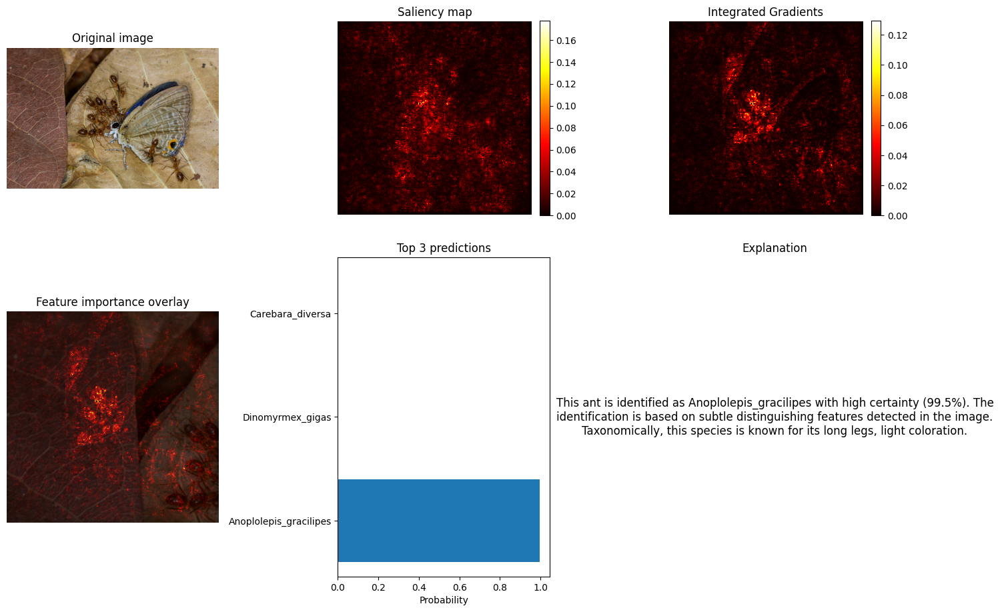


Explanation for sample 3: data/Tapinoma_melanocephalum/Tapinoma_melanocephalum_1.jpg
Predicted: Tapinoma_melanocephalum (Confidence: 0.89)

Top predictions:
- Tapinoma_melanocephalum: 0.89
- Dolichoderus_thoracicus: 0.03
- Carebara_diversa: 0.03

Feature importance level: 0.0056

Explanation: This ant is identified as Tapinoma_melanocephalum with high certainty (88.7%). The identification is based on subtle distinguishing features detected in the image. Taxonomically, this species is known for its small size, light body with dark head.


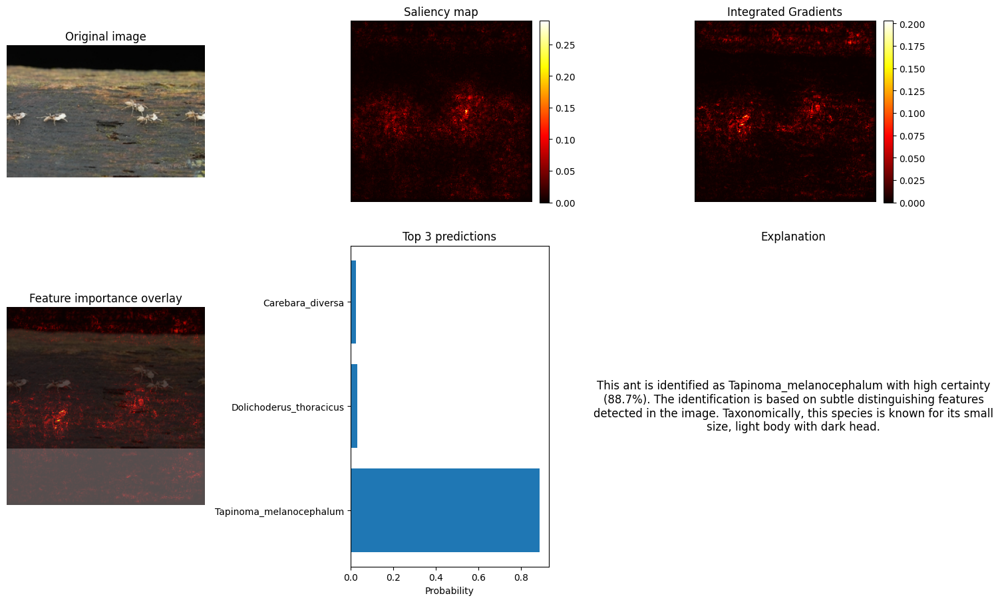

In [18]:
import os
import numpy as np
import torch
from PIL import Image
from captum.attr import Saliency, IntegratedGradients
from captum.attr import visualization as viz

import matplotlib.pyplot as plt

def explain_prediction(model, img_path, class_names, device='cpu'):
    """
    Provides a comprehensive explanation for a model's prediction on an ant image
    
    Parameters:
        model: The trained model
        img_path: Path to the image to explain
        class_names: List of class names
        device: Device to run inference on ('cpu' or 'cuda')
        
    Returns:
        Dictionary with explanation data
    """
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    input_tensor = transform(img).unsqueeze(0).to(device)
    
    # Get model prediction
    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        confidence, pred_idx = torch.max(probabilities, 1)
        predicted_class = class_names[pred_idx.item()]
        confidence_value = confidence.item()
    
    # Get top 3 predictions
    top_3_prob, top_3_idx = torch.topk(probabilities, 3, dim=1)
    top_3_classes = [class_names[idx.item()] for idx in top_3_idx[0]]
    top_3_confidence = top_3_prob[0].cpu().numpy()
    
    # Apply attribution methods
    input_tensor.requires_grad = True
    
    # 1. Saliency maps
    saliency = Saliency(model)
    saliency_attr = saliency.attribute(input_tensor, target=pred_idx.item())
    saliency_map = saliency_attr.squeeze().cpu().detach().numpy()
    saliency_map = np.abs(saliency_map).mean(axis=0)  # Average over color channels
    
    # 2. Integrated Gradients
    ig = IntegratedGradients(model)
    ig_attr = ig.attribute(input_tensor, target=pred_idx.item(), n_steps=50)
    ig_map = ig_attr.squeeze().cpu().detach().numpy()
    ig_map = np.abs(ig_map).mean(axis=0)  # Average over color channels
    
    # Determine feature importance level
    importance_level = np.mean(ig_map)
    if importance_level > 0.6:
        feature_desc = "highly distinctive features"
    elif importance_level > 0.4:
        feature_desc = "moderately distinctive features"
    else:
        feature_desc = "subtle distinguishing features"
    
    # Create human-readable explanation
    if confidence_value > 0.7:
        certainty = "high certainty"
    elif confidence_value > 0.4:
        certainty = "moderate certainty"
    else:
        certainty = "low certainty"
    
    # Generate alternatives text if confidence is not high
    if confidence_value < 0.6:
        alternatives = ", ".join([f"{cls} ({conf:.1%})" for cls, conf in 
                                 zip(top_3_classes[1:], top_3_confidence[1:])])
        alt_text = f" Alternative species that this could be: {alternatives}."
    else:
        alt_text = ""
    
    # Determine taxonomic features based on class
    taxonomy_features = {
        'Tetraponera_rufonigra': "elongated body, distinct petiole",
        'Anoplolepis_gracilipes': "long legs, light coloration",
        'Anochetus_graeffei': "trap jaw mandibles, slim thorax",
        'Tapinoma_melanocephalum': "small size, light body with dark head",
        'Recurvidris_recurvispinosa': "curved spines on propodeum"
    }
    
    taxonomic_desc = taxonomy_features.get(predicted_class, "distinctive body structure")
    
    # Create final explanation
    explanation = (f"This ant is identified as {predicted_class} with {certainty} ({confidence_value:.1%}). "
                  f"The identification is based on {feature_desc} detected in the image. "
                  f"Taxonomically, this species is known for its {taxonomic_desc}.{alt_text}")
    
    return {
        'predicted_class': predicted_class,
        'confidence': confidence_value,
        'top_3_classes': list(zip(top_3_classes, top_3_confidence)),
        'explanation': explanation,
        'saliency_map': saliency_map,
        'integrated_gradients_map': ig_map,
        'input_image': img,
        'feature_importance': importance_level
    }

def visualize_explanation(explanation):
    """
    Visualizes the explanation with heatmaps and text
    """
    # Setup the figure
    fig = plt.figure(figsize=(15, 10))
    
    # 1. Original image
    ax1 = plt.subplot(2, 3, 1)
    ax1.imshow(explanation['input_image'])
    ax1.set_title("Original image")
    ax1.axis('off')
    
    # 2. Saliency map
    ax2 = plt.subplot(2, 3, 2)
    im2 = ax2.imshow(explanation['saliency_map'], cmap='hot')
    ax2.set_title("Saliency map")
    ax2.axis('off')
    plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)
    
    # 3. Integrated Gradients map
    ax3 = plt.subplot(2, 3, 3)
    im3 = ax3.imshow(explanation['integrated_gradients_map'], cmap='hot')
    ax3.set_title("Integrated Gradients")
    ax3.axis('off')
    plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)
    
    # 4. Overlay of IG on original
    ax4 = plt.subplot(2, 3, 4)
    ax4.imshow(explanation['input_image'])
    im4 = ax4.imshow(explanation['integrated_gradients_map'], cmap='hot', alpha=0.7)
    ax4.set_title("Feature importance overlay")
    ax4.axis('off')
    
    # 5. Bar chart of top class probabilities
    ax5 = plt.subplot(2, 3, 5)
    top_classes = [c for c, _ in explanation['top_3_classes']]
    top_probs = [p for _, p in explanation['top_3_classes']]
    y_pos = np.arange(len(top_classes))
    ax5.barh(y_pos, top_probs)
    ax5.set_yticks(y_pos)
    ax5.set_yticklabels(top_classes)
    ax5.set_title("Top 3 predictions")
    ax5.set_xlabel("Probability")
    
    # 6. Text explanation with anatomical regions
    ax6 = plt.subplot(2, 3, 6)
    ax6.text(0.5, 0.5, explanation['explanation'], 
             ha='center', va='center', wrap=True,
             fontsize=12)
    ax6.axis('off')
    ax6.set_title("Explanation")
    
    plt.tight_layout()
    return fig

# Function to run explanations on sample images
def run_sample_explanations(model, model_path, class_names, device='cpu'):
    """
    Run explanations on sample images without needing test_dataset
    
    Args:
        model: Model architecture (without loaded weights)
        model_path: Path to model weights file
        class_names: List of class names
        device: Device to run on
    """
    # Define sample paths to ant images (update these paths to match your actual data)
    sample_paths = [
        'data/Tetraponera_rufonigra/Tetraponera_rufonigra_1.jpg',
        'data/Anoplolepis_gracilipes/Anoplolepis_gracilipes_1.jpg',
        'data/Tapinoma_melanocephalum/Tapinoma_melanocephalum_1.jpg'
    ]
    
    # First load the state_dict to inspect it
    try:
        state_dict = torch.load(model_path, map_location=device)
        
        # Detect the number of classes from the classifier weights
        if 'classifier.1.weight' in state_dict:
            num_classes = state_dict['classifier.1.weight'].size(0)
            print(f"Detected {num_classes} classes in the saved model")
            
            # Recreate the model with the correct number of classes
            model = models.squeezenet1_0(pretrained=False)
            model.classifier[1] = torch.nn.Conv2d(512, num_classes, kernel_size=1)
            
            # Now load the weights
            model.load_state_dict(state_dict)
            model = model.to(device)
            
            # If provided class_names has wrong length, create meaningful names instead of generic ones
            if len(class_names) != num_classes:
                print(f"Warning: {len(class_names)} class names provided but model has {num_classes} classes.")
                print("Using folder names or inferred species names.")
                
                # Try to infer class names from data directory if possible
                try:
                    # Get all species folders
                    data_folders = sorted([f for f in os.listdir('data/') if os.path.isdir(os.path.join('data/', f))])
                    
                    if len(data_folders) >= num_classes:
                        # Use the first num_classes folder names if we have enough
                        class_names = data_folders[:num_classes]
                    else:
                        # Otherwise, combine the known names with defaults
                        known_species = [
                            'Tetraponera_rufonigra', 'Anoplolepis_gracilipes', 'Anochetus_graeffei', 
                            'Tapinoma_melanocephalum', 'Recurvidris_recurvispinosa', 'Carebara_diversa', 
                            'Dinomyrmex_gigas', 'Dolichoderus_thoracicus', 'Iridomyrmex_anceps', 
                            'Leptogenys_birmana', 'Monomorium_floricola', 'Odontoponera_denticulata', 
                            'Polyrhachis_armata', 'Pseudoneoponera_rufipes', 'Solenopsis_geminata'
                        ]
                        # Take as many as we need from the known species list
                        class_names = known_species[:num_classes]
                        
                        # If we still don't have enough, add species with numbers
                        if len(class_names) < num_classes:
                            for i in range(len(class_names), num_classes):
                                class_names.append(f"Ant_Species_{i+1}")
                except Exception as e:
                    print(f"Error inferring class names: {e}")
                    # Fallback: Use ant species names instead of generic Class_X
                    class_names = [f"Ant_Species_{i+1}" for i in range(num_classes)]
        else:
            raise ValueError("Could not determine number of classes from state dict")
    except Exception as e:
        print(f"Error loading model: {e}")
        return
    
    # Process each sample image
    for i, img_path in enumerate(sample_paths):
        try:
            # Skip if file doesn't exist
            if not os.path.exists(img_path):
                print(f"Warning: Sample image {img_path} not found, skipping.")
                continue
                
            print(f"\nExplanation for sample {i+1}: {img_path}")
            explanation = explain_prediction(model, img_path, class_names, device)
            
            # Print key information
            print(f"Predicted: {explanation['predicted_class']} (Confidence: {explanation['confidence']:.2f})")
            print("\nTop predictions:")
            for cls, conf in explanation['top_3_classes']:
                print(f"- {cls}: {conf:.2f}")
                
            print(f"\nFeature importance level: {explanation['feature_importance']:.4f}")
            print(f"\nExplanation: {explanation['explanation']}")
            
            # Visualize the explanation
            fig = visualize_explanation(explanation)
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error processing sample {img_path}: {e}")

# Example usage - run this with your best model
if __name__ == "__main__":
    # Check device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Set paths - update these if needed
    model_path = 'squeezenet1_0_best.pth'  # Path to the model weights
    
    # Get class names from species mapping
    class_names = list(idx_to_species.values()) if 'idx_to_species' in globals() else [
        'Tetraponera_rufonigra', 'Anoplolepis_gracilipes', 'Anochetus_graeffei', 
        'Tapinoma_melanocephalum', 'Recurvidris_recurvispinosa'
    ]  # Fallback class names
    
    # Initialize model architecture (without loading weights yet)
    model = models.squeezenet1_0(pretrained=False)
    model.classifier[1] = torch.nn.Conv2d(512, len(class_names), kernel_size=1)
    
    # Run explanations
    run_sample_explanations(model, model_path, class_names, device)

# Model Deployment as a Service

In [ ]:
from flask import Flask, request, jsonify
import torch
from PIL import Image
import io
import base64
import numpy as np
from captum.attr import IntegratedGradients
import logging
import os
from torchvision import models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

app = Flask(__name__)

# Configure logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Load model and metadata
def load_model(model_path, num_classes):
    logger.info(f"Loading model from {model_path}")
    try:
        model = models.squeezenet1_0(pretrained=True) # Example model
        model.classifier[1] = torch.nn.Conv2d(512, num_classes, kernel_size=1)
        model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
        model.eval()
        return model
    except Exception as e:
        logger.error(f"Error loading model: {str(e)}")
        raise

# Define transformation pipeline
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Mapping of class indices to species names
class_names = [
    'Anochetus_graeffei', 'Anoplolepis_gracilipes', 'Carebara_diversa', 
    'Dinomyrmex_gigas', 'Dolichoderus_thoracicus', 'Iridomyrmex_anceps', 
    'Leptogenys_birmana', 'Monomorium_floricola', 'Odontoponera_denticulata', 
    'Polyrhachis_armata', 'Pseudoneoponera_rufipes', 'Recurvidris_recurvispinosa', 
    'Solenopsis_geminata', 'Tapinoma_melanocephalum', 'Tetraponera_rufonigra'
]

# Initialize model
MODEL_PATH = 'squeezenet1_0_best.pth' # Replace with model path
NUM_CLASSES = len(class_names)
model = load_model(MODEL_PATH, NUM_CLASSES)

# Generate visualizations for model explanations
def generate_heatmap(tensor_img, pred_class):
    # Apply Integrated Gradients
    ig = IntegratedGradients(model)
    attributions = ig.attribute(tensor_img.unsqueeze(0), target=pred_class, n_steps=50)
    
    # Convert to numpy and average across channels
    attr_np = attributions.squeeze().cpu().detach().numpy()
    attr_mag = np.abs(attr_np).mean(axis=0)
    
    # Normalize for visualization
    attr_mag = (attr_mag - attr_mag.min()) / (attr_mag.max() - attr_mag.min() + 1e-8)
    
    return attr_mag

# Function to convert heatmap to base64 image
def heatmap_to_base64(img_tensor, heatmap):
    plt.figure(figsize=(6, 6))
    
    # Denormalize the image
    img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
    img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    img_np = np.clip(img_np, 0, 1)
    
    # Plot the overlay
    plt.imshow(img_np)
    plt.imshow(heatmap, cmap='hot', alpha=0.6)
    plt.axis('off')
    plt.tight_layout()
    
    # Convert to base64
    buffer = io.BytesIO()
    plt.savefig(buffer, format='png')
    buffer.seek(0)
    plt.close()
    
    return base64.b64encode(buffer.getvalue()).decode('utf-8')

# API endpoints
@app.route('/health', methods=['GET'])
def health_check():
    """Health check endpoint"""
    return jsonify({"status": "healthy"})

@app.route('/api/predict', methods=['POST'])
def predict():
    """
    Predict ant species from uploaded image
    
    Expects: multipart/form-data with an 'image' file
    Returns: JSON with predictions and optional explanation
    """
    if 'image' not in request.files:
        return jsonify({"error": "No image provided"}), 400
    
    try:
        file = request.files['image']
        img = Image.open(file.stream).convert('RGB')
        
        # Preprocess image
        img_tensor = transform(img)
        
        # Get model prediction
        with torch.no_grad():
            outputs = model(img_tensor.unsqueeze(0))
            probabilities = torch.nn.functional.softmax(outputs, dim=1)[0]
            confidence, predicted_class = torch.max(probabilities, 0)
        
        # Get top 3 predictions
        top_3_prob, top_3_idx = torch.topk(probabilities, 3)
        top_3_classes = [(class_names[idx.item()], prob.item()) for idx, prob in zip(top_3_idx, top_3_prob)]
        
        # Generate explanation if requested
        include_explanation = request.args.get('explain', 'false').lower() == 'true'
        explanation_data = {}
        
        if include_explanation:
            # Generate heatmap
            heatmap = generate_heatmap(img_tensor, predicted_class.item())
            heatmap_b64 = heatmap_to_base64(img_tensor, heatmap)
            
            # Generate explanation text
            if confidence.item() > 0.7:
                certainty = "high confidence"
            elif confidence.item() > 0.4:
                certainty = "moderate confidence"
            else:
                certainty = "low confidence"
                
            explanation = f"This ant is identified as {class_names[predicted_class.item()]} with {certainty} ({confidence.item():.2f}). "
            
            # Add alternatives if confidence is low
            if confidence.item() < 0.6:
                alternatives = ", ".join([f"{cls} ({conf:.2f})" for cls, conf in top_3_classes[1:]])
                explanation += f"Alternative possibilities include: {alternatives}."
            
            explanation_data = {
                "explanation_text": explanation,
                "heatmap": heatmap_b64
            }
        
        result = {
            "success": True,
            "prediction": {
                "class": class_names[predicted_class.item()],
                "confidence": confidence.item(),
                "top_3_predictions": top_3_classes
            }
        }
        
        if explanation_data:
            result["explanation"] = explanation_data
        
        return jsonify(result)
        
    except Exception as e:
        logger.error(f"Error processing request: {str(e)}")
        return jsonify({"error": str(e)}), 500

@app.route('/api/batch_predict', methods=['POST'])
def batch_predict():
    """
    Process multiple images in one request
    
    Expects: JSON with a list of base64-encoded images
    Returns: JSON with predictions for each image
    """
    if not request.json or 'images' not in request.json:
        return jsonify({"error": "No images provided in JSON"}), 400
    
    results = []
    
    try:
        for i, img_data in enumerate(request.json['images']):
            try:
                # Decode base64 image
                img_bytes = base64.b64decode(img_data)
                img = Image.open(io.BytesIO(img_bytes)).convert('RGB')
                
                # Preprocess and predict
                img_tensor = transform(img)
                
                with torch.no_grad():
                    outputs = model(img_tensor.unsqueeze(0))
                    probabilities = torch.nn.functional.softmax(outputs, dim=1)[0]
                    confidence, predicted_class = torch.max(probabilities, 0)
                
                results.append({
                    "image_id": i,
                    "class": class_names[predicted_class.item()],
                    "confidence": confidence.item()
                })
                
            except Exception as img_error:
                results.append({
                    "image_id": i,
                    "error": str(img_error)
                })
        
        return jsonify({"results": results})
        
    except Exception as e:
        logger.error(f"Error processing batch request: {str(e)}")
        return jsonify({"error": str(e)}), 500

@app.route('/api/docs', methods=['GET'])
def api_docs():
    """Return API documentation"""
    docs = {
        "endpoints": [
            {
                "path": "/health",
                "method": "GET",
                "description": "Health check endpoint",
                "parameters": [],
                "responses": {
                    "200": {"status": "healthy"}
                }
            },
            {
                "path": "/api/predict",
                "method": "POST",
                "description": "Predict ant species from an image",
                "parameters": [
                    {
                        "name": "image",
                        "in": "formData",
                        "type": "file",
                        "required": True,
                        "description": "Image file to classify"
                    },
                    {
                        "name": "explain",
                        "in": "query",
                        "type": "boolean",
                        "default": False,
                        "description": "Whether to include model explanation"
                    }
                ],
                "responses": {
                    "200": "JSON with prediction results",
                    "400": "Error when no image is provided",
                    "500": "Server error"
                }
            },
            {
                "path": "/api/batch_predict",
                "method": "POST",
                "description": "Process multiple images in one request",
                "parameters": [
                    {
                        "name": "images",
                        "in": "body",
                        "type": "array",
                        "required": True,
                        "description": "Array of base64-encoded images"
                    }
                ],
                "responses": {
                    "200": "JSON with prediction results for each image",
                    "400": "Error when no images are provided",
                    "500": "Server error"
                }
            }
        ],
        "models": {
            "supported_classes": class_names
        }
    }
    
    return jsonify(docs)

# Running the app
if __name__ == '__main__':
    # Create uploads folder if it doesn't exist
    os.makedirs('uploads', exist_ok=True)
    
    # Start the Flask server
    port = int(os.environ.get("PORT", 5000))
    app.run(host='0.0.0.0', port=port, debug=False)